**Predicting User Churn in the Waze App with Python and Machine Learning**


# Introduction


**Background**:

I am a Machine Learning Specialist working with Waze’s data team to combat user churn. The Waze app, renowned for improving navigation efficiency and safety, faces a challenge: some users uninstall the app or stop using it altogether. Retaining users is critical, as satisfied users lead to consistent growth.

To address this, the Waze data team is tasked with building a churn prediction model. This model will enable the company to proactively identify users at risk of churning and take measures to improve their experience. The ultimate goal is to guide leadership in refining their retention strategies with data-driven insights.


---


**Project Objectives**


- Feature Engineering: Transform raw data into meaningful features for model training.
- Model Development: Build and train machine learning models, specifically:
Random Forest
XGBoost
- Model Evaluation: Assess the performance of these models using appropriate metrics (e.g., accuracy, precision, recall, F1 score, AUC-ROC).
Insights Communication: Summarise findings in an executive summary, tailored for both technical and non-technical stakeholders.


---


**Approach**
- Data Preparation and Exploration: Analyse the dataset for trends, anomalies, and missing values.
Identify features linked to user churn, such as app usage frequency, user engagement patterns, and geographic data.
- Feature Engineering: Derive key predictors of churn, like session duration, interaction with app features, and user feedback ratings.
- Encode categorical variables and normalise numerical ones for model compatibility.
Model Building

- Train a Random Forest model to capture feature importance and provide robust predictions.
- Implement XGBoost, optimising hyperparameters for improved accuracy on imbalanced datasets.
- Evaluation: Compare models based on metrics such as precision and recall (critical for churn prediction, where false negatives are costly).
Perform cross-validation to ensure generalisability of results.
- Actionable Insights:  Identify high-risk user segments and explore reasons behind churn.
Recommend retention strategies (e.g., targeted offers, app feature enhancements).


---



**Example Insights**

Question: Who are the users most likely to churn?
Answer: Users with low engagement (e.g., minimal weekly app interactions) and those who recently moved to areas with poor Waze coverage are at higher risk of churning.

Question: Why do users churn?
Answer: User feedback indicates frustration with app response times and lack of accurate route suggestions in less urbanised regions.

Question: When do users churn?
Answer: Churn peaks during seasonal transitions (e.g., summer holidays), potentially due to decreased commuting needs.

Key Takeaways for Stakeholders
For Leadership: Investing in targeted retention campaigns for high-risk users can significantly improve retention rates.
For Product Teams: Enhancing features like route accuracy and app responsiveness will directly address churn factors.


| **Metric**                  | **Description**                                                                                   |
|-----------------------------|---------------------------------------------------------------------------------------------------|
| **ID**                      | A unique identifier for each user, allowing individual tracking within the dataset.              |
| **Label**                   | The binary target variable indicating whether the user has churned (`churned`) or is retained (`retained`). |
| **Sessions**                | The number of times a user opened the Waze app within a given time frame, reflecting activity levels. |
| **Drives**                  | The count of driving instances where the user drove at least 1 kilometre, indicating app engagement. |
| **Total_Sessions**          | The estimated cumulative number of sessions since the user onboarded with Waze.                  |
| **n_days_after_onboarding** | The number of days since the user first signed up for Waze, useful for understanding user tenure. |
| **Total_navigations_fav1**  | The number of navigations to the user’s first saved favourite destination.                        |
| **Total_navigations_fav2**  | The number of navigations to the user’s second saved favourite destination.                       |
| **Driven_km_drives**        | The total distance, in kilometres, driven during logged drives, reflecting driving activity.      |
| **Duration_minutes_drives** | The total time, in minutes, spent driving during logged drives, representing app usage duration.  |
| **Activity_days**           | The number of days a user was active within a given period, providing insight into app engagement. |
| **Driving_days**            | The number of days a user logged drives, showing regularity in app usage.                        |
| **Device**                  | The type of device (e.g., Android or iOS) used for accessing the app, potentially impacting user behaviour. |


In [82]:
# prompt: recall data from my google drive waze_dataset.csv

import pandas as pd

# Mount Google Drive if not already mounted
from google.colab import drive
drive.mount('/content/drive')

# Load the dataset
file_path = '/content/drive/My Drive/waze_dataset.csv'  # Update with the correct path
# Load dataset into dataframe
df = pd.read_csv('/content/drive/My Drive/waze_dataset.csv')
df.head(10)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,ID,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device
0,0,retained,283,226,296.748273,2276,208,0,2628.845068,1985.775061,28,19,Android
1,1,retained,133,107,326.896596,1225,19,64,13715.920550,3160.472914,13,11,iPhone
2,2,retained,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,Android
3,3,retained,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,iPhone
4,4,retained,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,Android
5,5,retained,113,103,279.544437,2637,0,0,901.238699,439.101397,15,11,iPhone
6,6,retained,3,2,236.725314,360,185,18,5249.172828,726.577205,28,23,iPhone
7,7,retained,39,35,176.072845,2999,0,0,7892.052468,2466.981741,22,20,iPhone
8,8,retained,57,46,183.532018,424,0,26,2651.709764,1594.342984,25,20,Android
9,9,churned,84,68,244.802115,2997,72,0,6043.460295,2341.838528,7,3,iPhone


In [ ]:
# verify the shape of data
df.shape

(14999, 13)

In [ ]:
df.dtypes.sort_values(ascending=False)

,0
label,object
device,object
total_sessions,float64
driven_km_drives,float64
duration_minutes_drives,float64
ID,int64
sessions,int64
drives,int64
n_days_after_onboarding,int64
total_navigations_fav1,int64


In [ ]:
df.size #used to determine the total number of elements in a DataFrame, which includes both rows and columns.

194987

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       14999 non-null  int64  
 1   label                    14299 non-null  object 
 2   sessions                 14999 non-null  int64  
 3   drives                   14999 non-null  int64  
 4   total_sessions           14999 non-null  float64
 5   n_days_after_onboarding  14999 non-null  int64  
 6   total_navigations_fav1   14999 non-null  int64  
 7   total_navigations_fav2   14999 non-null  int64  
 8   driven_km_drives         14999 non-null  float64
 9   duration_minutes_drives  14999 non-null  float64
 10  activity_days            14999 non-null  int64  
 11  driving_days             14999 non-null  int64  
 12  device                   14999 non-null  object 
dtypes: float64(3), int64(8), object(2)
memory usage: 1.5+ MB


In [ ]:
missing_values = df.isnull()#NaN

print(missing_values)

          ID  label  sessions  drives  total_sessions  \
0      False  False     False   False           False   
1      False  False     False   False           False   
2      False  False     False   False           False   
3      False  False     False   False           False   
4      False  False     False   False           False   
...      ...    ...       ...     ...             ...   
14994  False  False     False   False           False   
14995  False  False     False   False           False   
14996  False  False     False   False           False   
14997  False  False     False   False           False   
14998  False  False     False   False           False   

       n_days_after_onboarding  total_navigations_fav1  \
0                        False                   False   
1                        False                   False   
2                        False                   False   
3                        False                   False   
4                        

In [ ]:
# Count the number of missing values in each column
missing_value_counts = df.isnull().sum()
missing_value_counts

,0
ID,0
label,700
sessions,0
drives,0
total_sessions,0
n_days_after_onboarding,0
total_navigations_fav1,0
total_navigations_fav2,0
driven_km_drives,0
duration_minutes_drives,0


In [ ]:
# Check for missing values in the entire DataFrame
missing_values = df.isnull().any()

print(missing_values)

ID                         False
label                       True
sessions                   False
drives                     False
total_sessions             False
n_days_after_onboarding    False
total_navigations_fav1     False
total_navigations_fav2     False
driven_km_drives           False
duration_minutes_drives    False
activity_days              False
driving_days               False
device                     False
dtype: bool


In [ ]:
# Isolate rows with null values
null_df = df[df['label'].isnull()]
#filters the original DataFrame using the B.S  (700 missing values in the label column)

null_df.describe()

,ID,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days
count,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000
mean,7405.584286,80.837143,67.798571,198.483348,1709.295714,118.717143,30.371429,3935.967029,1795.123358,15.382857,12.125714
std,4306.900234,79.987440,65.271926,140.561715,1005.306562,156.308140,46.306984,2443.107121,1419.242246,8.772714,7.626373
min,77.000000,0.000000,0.000000,5.582648,16.000000,0.000000,0.000000,290.119811,66.588493,0.000000,0.000000
25%,3744.500000,23.000000,20.000000,94.056340,869.000000,4.000000,0.000000,2119.344818,779.009271,8.000000,6.000000
50%,7443.000000,56.000000,47.500000,177.255925,1650.500000,62.500000,10.000000,3421.156721,1414.966279,15.000000,12.000000
75%,11007.000000,112.250000,94.000000,266.058022,2508.750000,169.250000,43.000000,5166.097373,2443.955404,23.000000,18.000000
max,14993.000000,556.000000,445.000000,1076.879741,3498.000000,1096.000000,352.000000,15135.391280,9746.253023,31.000000,30.000000


In [ ]:
# Isolate rows without null values
not_null_df = df[~df['label'].isnull()]
#~df['label'].isnull() :negates the boolean Series, so it will be True for rows where 'label' is not null, and False for rows where 'label' is null.

In [ ]:
not_null_df

,ID,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device
0,0,retained,283,226,296.748273,2276,208,0,2628.845068,1985.775061,28,19,Android
1,1,retained,133,107,326.896596,1225,19,64,13715.920550,3160.472914,13,11,iPhone
2,2,retained,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,Android
3,3,retained,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,iPhone
4,4,retained,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,Android
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,14994,retained,60,55,207.875622,140,317,0,2890.496901,2186.155708,25,17,iPhone
14995,14995,retained,42,35,187.670313,2505,15,10,4062.575194,1208.583193,25,20,Android
14996,14996,retained,273,219,422.017241,1873,17,0,3097.825028,1031.278706,18,17,iPhone
14997,14997,churned,149,120,180.524184,3150,45,0,4051.758549,254.187763,6,6,iPhone


In [ ]:
# Get count of null values by device
null_df['device'].value_counts()

,count
device,
iPhone,447
Android,253


In [ ]:

import pandas as pd

def analyze_device_and_nulls(df):
    """
    Analyzes device types (iPhone and Android) and null values in a DataFrame.

    Args:
        df: The input DataFrame.

    Returns:
        None. Prints the analysis results.
    """

    # Count devices
    iphone_count = df[df['device'] == 'iPhone']['device'].count()
    android_count = df[df['device'] == 'Android']['device'].count()
    total_devices = iphone_count + android_count

    # Count nulls
    null_iphone_count = df[(df['device'] == 'iPhone') & (df['label'].isnull())]['label'].isnull().sum()
    null_android_count = df[(df['device'] == 'Android') & (df['label'].isnull())]['label'].isnull().sum()
    total_nulls = null_iphone_count + null_android_count

    # Calculate percentages
    iphone_null_percent = (null_iphone_count / iphone_count) * 100 if iphone_count else 0
    android_null_percent = (null_android_count / android_count) * 100 if android_count else 0
    total_null_percent = (total_nulls / total_devices) * 100 if total_devices else 0


    print(f"Total iPhones: {iphone_count}")
    print(f"Total Androids: {android_count}")
    print(f"Total Devices: {total_devices}")
    print(f"Null iPhones: {null_iphone_count} ({iphone_null_percent:.2f}%)")
    print(f"Null Androids: {null_android_count} ({android_null_percent:.2f}%)")
    print(f"Total Nulls: {total_nulls} ({total_null_percent:.2f}%)")

# Example usage (assuming 'df' is your DataFrame):
analyze_device_and_nulls(df)

Total iPhones: 9672
Total Androids: 5327
Total Devices: 14999
Null iPhones: 447 (4.62%)
Null Androids: 253 (4.75%)
Total Nulls: 700 (4.67%)


In [ ]:
# Calculate counts of churned vs. retained
print(df['label'].value_counts())
print()
print(df['label'].value_counts(normalize=True))

label
retained    11763
churned      2536
Name: count, dtype: int64

label
retained    0.822645
churned     0.177355
Name: proportion, dtype: float64


82% retained users and 18% churned users

In [ ]:
# Group the DataFrame by the 'label' column and calculate the median for each group
# Calculate median values of all columns for churned and retained users
df.groupby('label').median(numeric_only=True)

,ID,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days
label,,,,,,,,,,,
churned,7477.5,59.0,50.0,164.339042,1321.0,84.5,11.0,3652.655666,1607.183785,8.0,6.0
retained,7509.0,56.0,47.0,157.586756,1843.0,68.0,9.0,3464.684614,1458.046141,17.0,14.0


In [ ]:
# Group data by `label` and calculate the medians
medians_by_label = df.groupby('label').median(numeric_only=True)
print('Median kilometers per drive:')
# Divide the median distance by median number of drives
medians_by_label['driven_km_drives'] / medians_by_label['drives']

Median kilometers per drive:


,0
label,
churned,73.053113
retained,73.716694


In [ ]:
# Divide the median distance by median number of driving days
print('Median kilometers per driving day:')
medians_by_label['driven_km_drives'] / medians_by_label['driving_days']

Median kilometers per driving day:


,0
label,
churned,608.775944
retained,247.477472


In [ ]:
# Divide the median number of drives by median number of driving days
print('Median drives per driving day:')
medians_by_label['drives'] / medians_by_label['driving_days']

Median drives per driving day:


,0
label,
churned,8.333333
retained,3.357143


In [ ]:
# For each label, calculate the percentage of Android users and iPhone users
df.groupby('label')['device'].value_counts(normalize=True)

label     device 
churned   iPhone     0.648659
          Android    0.351341
retained  iPhone     0.644393
          Android    0.355607
Name: proportion, dtype: float64

Did the data contain any missing values? How many, and which variables were affected? Was there a pattern to the missing data?​
The dataset has 700 missing values in the label column. There was no obvious pattern to the missing values.​

What is a benefit of using the median value of a sample instead of the mean?​
Mean is subject to the influence of outliers, while the median represents the middle value of the distribution regardless of any outlying values.​

Did your investigation give rise to further questions that you would like to explore or ask the Waze team about?​
Yes. For example, the median user who churned drove 608 kilometers each day they drove last month, which is almost 250% the per-drive-day distance of retained users. It would be helpful to know how this data was collected and if it represents a non-random sample of users.​

What percentage of the users in the dataset were Android users and what percentage were iPhone users?​
Android users comprised approximately 36% of the sample, while iPhone users made up about 64%​

What were some distinguishing characteristics of users who churned vs. users who were retained?​
Generally, users who churned drove farther and longer in fewer days than retained users. They also used the app about half as many times as retained users over the same period.​

Was there an appreciable difference in churn rate between iPhone users vs. Android users?​
No. The churn rate for both iPhone and Android users was within one percentage point of each other. There is nothing suggestive of churn being correlated with device.

# Exploratory data analysis (EDA)

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [4]:
df.columns

Index(['ID', 'label', 'sessions', 'drives', 'total_sessions',
       'n_days_after_onboarding', 'total_navigations_fav1',
       'total_navigations_fav2', 'driven_km_drives', 'duration_minutes_drives',
       'activity_days', 'driving_days', 'device'],
      dtype='object')

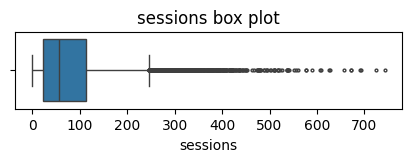

In [5]:
# Box plot
plt.figure(figsize=(5,1))
sns.boxplot(x=df['sessions'], fliersize=2)
#The fliersize parameter is used to set the size of the outliers
plt.title('sessions box plot');

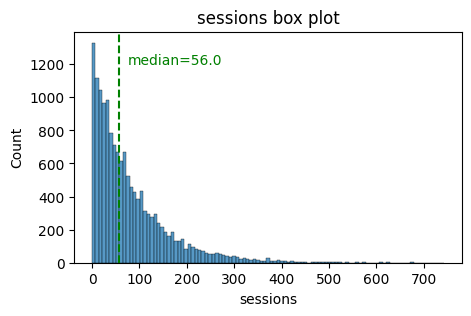

In [8]:
# Histogram
plt.figure(figsize=(5,3))
sns.histplot(x=df['sessions'])
median = df['sessions'].median()
# Add a vertical line at the median
plt.axvline(median, color='green', linestyle='--')
# Label the median with text
plt.text(75,1200, 'median=56.0', color='green')
plt.title('sessions box plot');

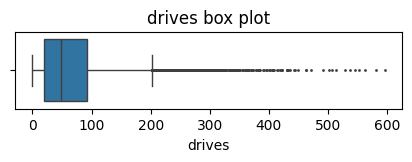

In [9]:
# Box plot
plt.figure(figsize=(5,1))
##The fliersize parameter is used to set the size of the outliers
sns.boxplot(x=df['drives'], fliersize=1)
plt.title('drives box plot');

In [11]:
# Helper function to plot histograms based on the
# format of the `sessions` histogram
def histogrammer(column_str, median_text=True, **kwargs):    # **kwargs = any keyword arguments
                                                             # from the sns.histplot() function
    median=round(df[column_str].median(), 1)
    plt.figure(figsize=(5,3))
    ax = sns.histplot(x=df[column_str], **kwargs)            # Plot the histogram
    plt.axvline(median, color='Green', linestyle='--')

    #6  adding the median as text to the plot
    if median_text==True:                                    # Add median text unless set to False
        ax.text(0.25, 0.85, f'median={median}', color='Green',
            ha='left', va='top', transform=ax.transAxes)
    else:
        print('Median:', median)
        #this line sets the title of the histogram, which includes the name of the column for which the histogram was created.
    plt.title(f'{column_str} histogram');

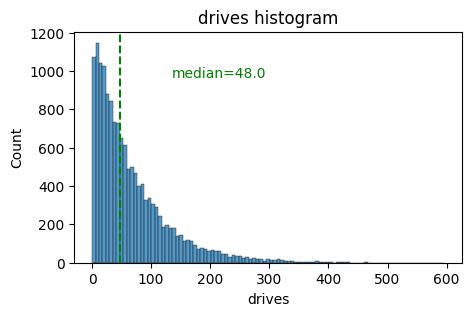

In [12]:
histogrammer('drives')


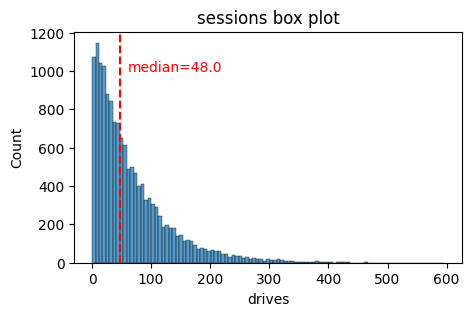

In [13]:
# Histogram
plt.figure(figsize=(5,3))
sns.histplot(x=df['drives'])
median = df['drives'].median()
# Add a vertical line at the median
plt.axvline(median, color='red', linestyle='--')
# Label the median with text
plt.text(60,1000, 'median=48.0', color='red')
plt.title('sessions box plot');

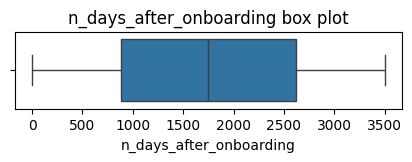

In [14]:
# Box plot
plt.figure(figsize=(5,1))
sns.boxplot(x=df['n_days_after_onboarding'], fliersize=1)
plt.title('n_days_after_onboarding box plot');

Median: 1741.0


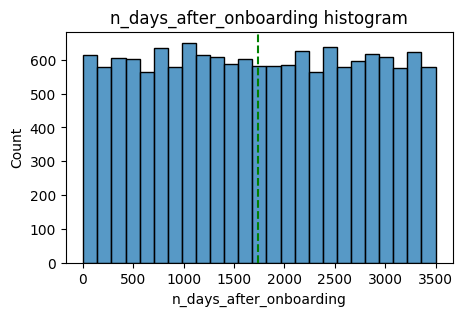

In [15]:
# Histogram
histogrammer('n_days_after_onboarding', median_text=False)# is set to False, it doesn't add the median as text on the histogram.

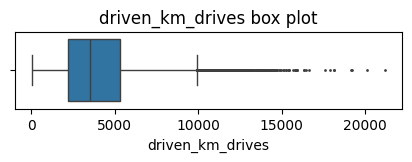

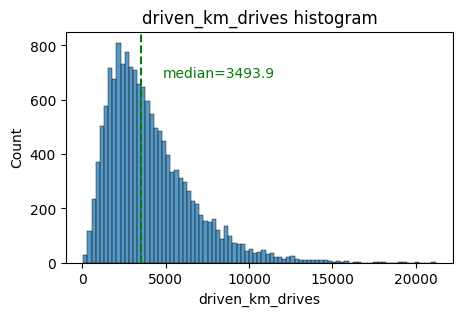

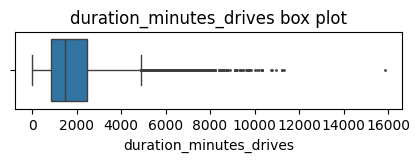

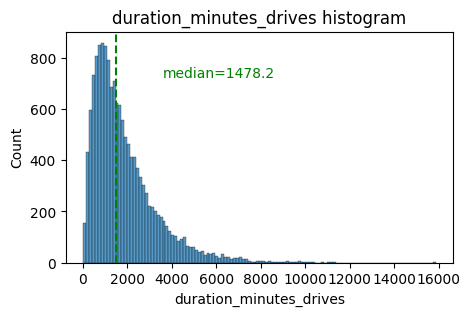

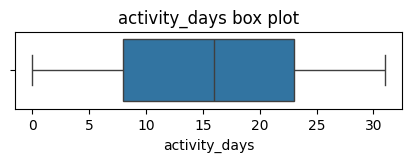

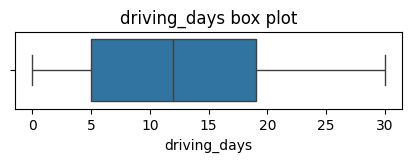

In [18]:
# prompt: write a code that show same time: #driven_km_drives
# # Box plot
# plt.figure(figsize=(5,1))
# sns.boxplot(x=df['driven_km_drives'], fliersize=1)
# plt.title('driven_km_drives box plot');
# histogrammer('driven_km_drives')  # Box plot
# plt.figure(figsize=(5,1))
# sns.boxplot(x=df['duration_minutes_drives'], fliersize=1)
# plt.title('duration_minutes_drives box plot');  # Histogram
# histogrammer('duration_minutes_drives')  # Box plot
# plt.figure(figsize=(5,1))
# sns.boxplot(x=df['activity_days'], fliersize=1)
# plt.title('activity_days box plot');    # Box plot
# plt.figure(figsize=(5,1))
# sns.boxplot(x=df['driving_days'], fliersize=1)
# plt.title('driving_days box plot');

# Box plot
plt.figure(figsize=(5,1))
sns.boxplot(x=df['driven_km_drives'], fliersize=1)
plt.title('driven_km_drives box plot');
histogrammer('driven_km_drives')

# Box plot
plt.figure(figsize=(5,1))
sns.boxplot(x=df['duration_minutes_drives'], fliersize=1)
plt.title('duration_minutes_drives box plot');
histogrammer('duration_minutes_drives')

# Box plot
plt.figure(figsize=(5,1))
sns.boxplot(x=df['activity_days'], fliersize=1)
plt.title('activity_days box plot');

# Box plot
plt.figure(figsize=(5,1))
sns.boxplot(x=df['driving_days'], fliersize=1)
plt.title('driving_days box plot');

Median: 12.0


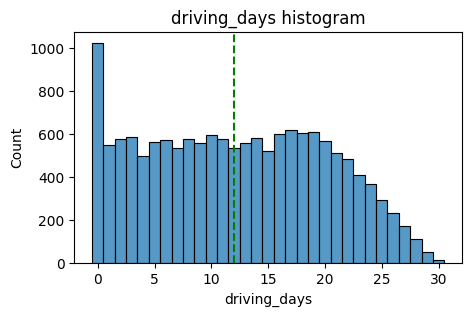

In [19]:
# Histogram
histogrammer('driving_days', median_text=False,discrete=True)

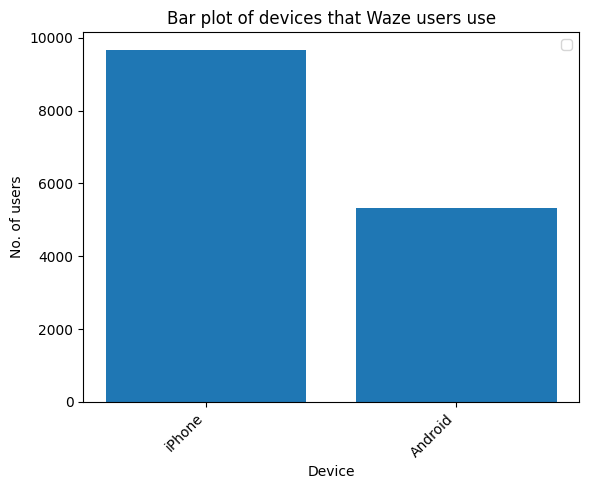

In [22]:
# calculate the no. of Android vs. iPhone users
df_bar_plot = df['device'].value_counts()

# create a bar plot
plt.bar(df_bar_plot.index,df_bar_plot) # df_bar_plot.index : specifically refers to the labels of the rows, which are typically used to identify individual data points or observations
plt.title("Bar plot of devices that Waze users use")
plt.xlabel("Device")
plt.ylabel("No. of users")
plt.xticks(rotation=45, horizontalalignment='right')

plt.legend()
plt.show()

In [27]:
fig = plt.figure(figsize=(4,4))
data=df['device'].value_counts()
data

,count
device,
iPhone,9672
Android,5327


<Figure size 400x400 with 0 Axes>

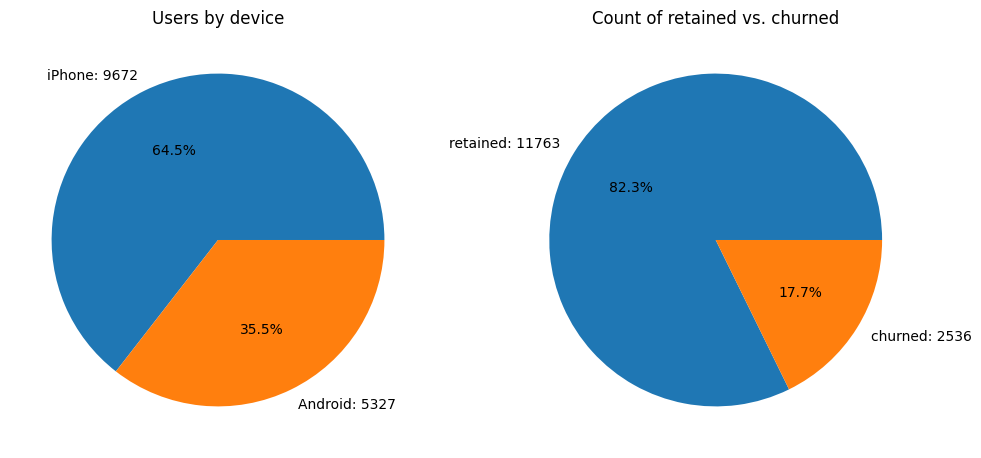

In [34]:
# prompt: makea code that two chart next to each other :
# data=df['device'].value_counts()
# plt.pie(data,
#         labels=[f'{data.index[0]}: {data.values[0]}',
#                 f'{data.index[1]}: {data.values[1]}'],
#         #This line specifies how to format the percentages displayed on each slice of the pie chart
#         autopct='%1.1f%%' # it calculated the percent of values in pie chart
#         )
# plt.title('Users by device');
# # Pie chart
# fig = plt.figure(figsize=(4,4))
# data=df['label'].value_counts()
# plt.pie(data,
#         labels=[f'{data.index[0]}: {data.values[0]}',
#                 f'{data.index[1]}: {data.values[1]}'],
#         autopct='%1.1f%%'
#         )
# plt.title('Count of retained vs. churned');

import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame and the necessary imports are already done

fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # Create a figure with two subplots

# First pie chart (Users by device)
data1 = df['device'].value_counts()
axes[0].pie(data1,
            labels=[f'{data1.index[0]}: {data1.values[0]}',
                    f'{data1.index[1]}: {data1.values[1]}'],
            autopct='%1.1f%%')
axes[0].set_title('Users by device')


# Second pie chart (Count of retained vs. churned)
data2 = df['label'].value_counts()
axes[1].pie(data2,
            labels=[f'{data2.index[0]}: {data2.values[0]}',
                    f'{data2.index[1]}: {data2.values[1]}'],
            autopct='%1.1f%%')
axes[1].set_title('Count of retained vs. churned')


plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

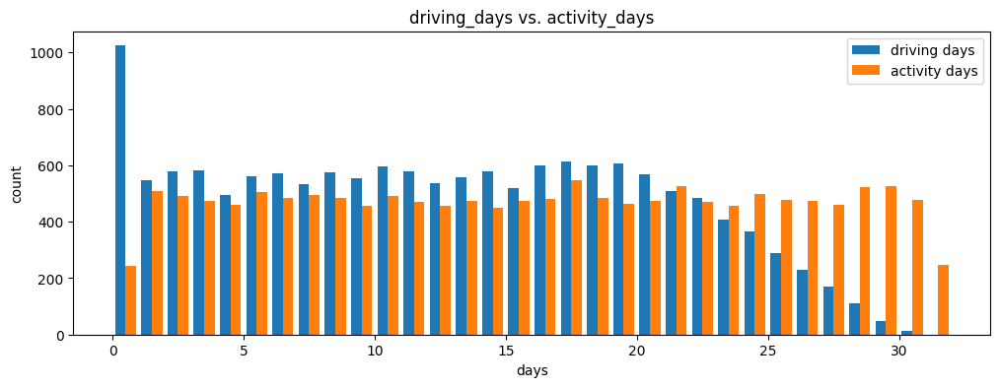

In [35]:
# Histogram
plt.figure(figsize=(12,4))
label=['driving days', 'activity days']
plt.hist([df['driving_days'], df['activity_days']],
         bins=range(0,33),

         label=label)
plt.xlabel('days')
plt.ylabel('count')
plt.legend()
plt.title('driving_days vs. activity_days');

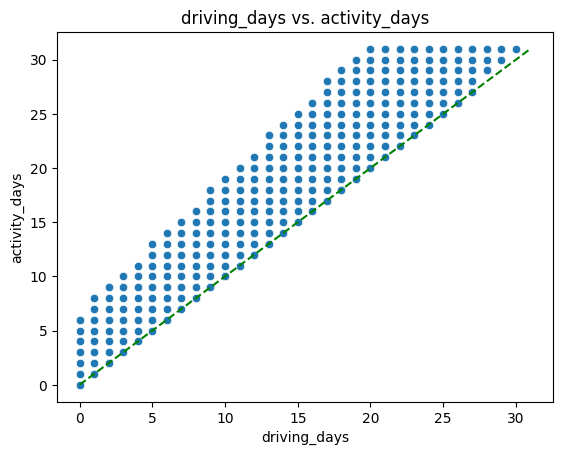

In [37]:
# Scatter plot
sns.scatterplot(data=df, x='driving_days', y='activity_days')
plt.title('driving_days vs. activity_days')
plt.plot([0,31], [0,31], color='Green', linestyle='--');

Retention by device
​Plot a histogram that has four bars—one for each device-label combination—to show how many iPhone users were retained/churned and how many Android users were retained/churned.



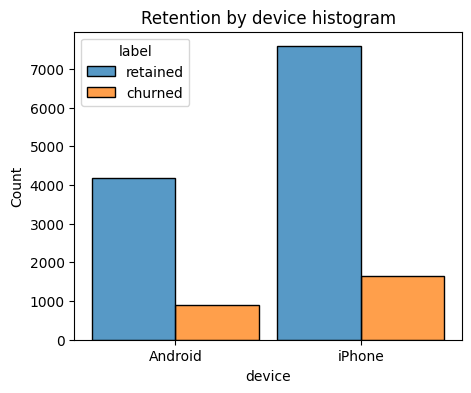

In [38]:
# Histogram
plt.figure(figsize=(5,4))
sns.histplot(data=df,
             x='device',
             hue='label', # for color
             multiple='dodge',
             shrink=0.9
             )
plt.title('Retention by device histogram');

**outliers**

In [41]:
def outlier_imputer(column_name, percentile):
    # Calculate threshold
    threshold = df[column_name].quantile(percentile)
    # Impute threshold for values > than threshold
    df.loc[df[column_name] > threshold, column_name] = threshold

    print('{:>25} | percentile: {} | threshold: {}'.format(column_name, percentile, threshold))

In [42]:
for column in ['sessions', 'drives', 'total_sessions',
               'driven_km_drives', 'duration_minutes_drives']:
               outlier_imputer(column, 0.95) # 0.95= 95%
 #The code outlier_imputer(column, 0.95) is calling the outlier_imputer function with two arguments: column and 0.95

                 sessions | percentile: 0.95 | threshold: 243.0
                   drives | percentile: 0.95 | threshold: 201.0
           total_sessions | percentile: 0.95 | threshold: 454.3632037399997
         driven_km_drives | percentile: 0.95 | threshold: 8889.7942356
  duration_minutes_drives | percentile: 0.95 | threshold: 4668.899348999998


In [43]:
df.describe()

,ID,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days
count,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000
mean,7499.000000,76.568705,64.058204,184.031320,1749.837789,121.605974,29.672512,3939.632764,1789.647426,15.537102,12.179879
std,4329.982679,67.297958,55.306924,118.600463,1008.513876,148.121544,45.394651,2216.041510,1222.705167,9.004655,7.824036
min,0.000000,0.000000,0.000000,0.220211,4.000000,0.000000,0.000000,60.441250,18.282082,0.000000,0.000000
25%,3749.500000,23.000000,20.000000,90.661156,878.000000,9.000000,0.000000,2212.600607,835.996260,8.000000,5.000000
50%,7499.000000,56.000000,48.000000,159.568115,1741.000000,71.000000,9.000000,3493.858085,1478.249859,16.000000,12.000000
75%,11248.500000,112.000000,93.000000,254.192341,2623.500000,178.000000,43.000000,5289.861262,2464.362632,23.000000,19.000000
max,14998.000000,243.000000,201.000000,454.363204,3500.000000,1236.000000,415.000000,8889.794236,4668.899349,31.000000,30.000000


EDA has revealed that users who drive very long distances on their driving days are more likely to churn, but users who drive more often are less likely to churn.

What are the key variables associated with user churn?
Can we implement policies to reduce user churn?

In [44]:
df['monthly_drives_per_session_ratio'] = (df['drives']/df['sessions'])


In [45]:
df.head(10)

,ID,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device,monthly_drives_per_session_ratio
0,0,retained,243,201,296.748273,2276,208,0,2628.845068,1985.775061,28,19,Android,0.827160
1,1,retained,133,107,326.896596,1225,19,64,8889.794236,3160.472914,13,11,iPhone,0.804511
2,2,retained,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,Android,0.833333
3,3,retained,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,iPhone,0.816327
4,4,retained,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,Android,0.809524
5,5,retained,113,103,279.544437,2637,0,0,901.238699,439.101397,15,11,iPhone,0.911504
6,6,retained,3,2,236.725314,360,185,18,5249.172828,726.577205,28,23,iPhone,0.666667
7,7,retained,39,35,176.072845,2999,0,0,7892.052468,2466.981741,22,20,iPhone,0.897436
8,8,retained,57,46,183.532018,424,0,26,2651.709764,1594.342984,25,20,Android,0.807018
9,9,churned,84,68,244.802115,2997,72,0,6043.460295,2341.838528,7,3,iPhone,0.809524


What types of distributions did you notice in the variables? What did this tell you about the data?
Nearly all the variables were either very right-skewed or uniformly distributed. For the right-skewed distributions, this means that most users had values in the lower end of the range for that variable. For the uniform distributions, this means that users were generally equally likely to have values anywhere within the range for that variable.

Was there anything that led you to believe the data was erroneous or problematic in any way?
Most of the data was not problematic, and there was no indication that any single variable was completely wrong. However, several variables had highly improbable or perhaps even impossible outlying values, such as driven_km_drives. Some of the monthly variables also might be problematic, such as activity_days and driving_days, because one has a max value of 31 while the other has a max value of 30, indicating that data collection might not have occurred in the same month for both of these variables.

Did your investigation give rise to further questions that you would like to explore or ask the Waze team about?
Yes. I'd want to ask the Waze data team to confirm that the monthly variables were collected during the same month, given the fact that some have max values of 30 days while others have 31 days. I'd also want to learn why so many long-time users suddenly started using the app so much in just the last month. Was there anything that changed in the last month that might prompt this kind of behavior?

What percentage of users churned and what percentage were retained?
Less than 18% of users churned, and ~82% were retained.

What factors correlated with user churn? How?
Distance driven per driving day had a positive correlation with user churn. The farther a user drove on each driving day, the more likely they were to churn. On the other hand, number of driving days had a negative correlation with churn. Users who drove more days of the last month were less likely to churn.

Did newer uses have greater representation in this dataset than users with longer tenure? How do you know?
No. Users of all tenures from brand new to ~10 years were relatively evenly represented in the data. This is borne out by the histogram for n_days_after_onboarding, which reveals a uniform distribution for this variable.

**Prepare data for modeling**

In [46]:
df.isna()

,ID,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device,monthly_drives_per_session_ratio
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,False,False,False,False,False,False,False,False,False,False,False,False,False,False
14995,False,False,False,False,False,False,False,False,False,False,False,False,False,False
14996,False,False,False,False,False,False,False,False,False,False,False,False,False,False
14997,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [47]:
df.isna().sum()

,0
ID,0
label,700
sessions,0
drives,0
total_sessions,0
n_days_after_onboarding,0
total_navigations_fav1,0
total_navigations_fav2,0
driven_km_drives,0
duration_minutes_drives,0


**Remove outliers**

In [51]:
# filter the dataset and create a subset of data that DOES NOT have missing values

# inspect column, "label" without missing values
not_null_df = df[~df['label'].isnull()]

# generate summary statistics of selected observations
not_null_df.describe()
# method 1:
# nn_df = not_null_df
# method 2:
temp_nn_df = not_null_df.copy()
temp_nn_df
# calculate 25th percentile of driven_km_drives
percentile25 = temp_nn_df['driven_km_drives'].quantile(0.25)

# calculate 75th percentile of annual strikes
percentile75 = temp_nn_df['driven_km_drives'].quantile(0.75)

# calculate interquartile range
iqr = percentile75 - percentile25

# calculate upper and lower thresholds for outliers
upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr

print('Lower limit is: ', lower_limit)
print('Outliers below upper limit is: ', temp_nn_df[temp_nn_df['driven_km_drives'] < lower_limit])
print()
print('Upper limit is: ', upper_limit)
print('Outliers above upper limit is: ', temp_nn_df[temp_nn_df['driven_km_drives'] > upper_limit])

Lower limit is:  -2406.65846925
Outliers below upper limit is:  Empty DataFrame
Columns: [ID, label, sessions, drives, total_sessions, n_days_after_onboarding, total_navigations_fav1, total_navigations_fav2, driven_km_drives, duration_minutes_drives, activity_days, driving_days, device, monthly_drives_per_session_ratio]
Index: []

Upper limit is:  9923.95054075
Outliers above upper limit is:  Empty DataFrame
Columns: [ID, label, sessions, drives, total_sessions, n_days_after_onboarding, total_navigations_fav1, total_navigations_fav2, driven_km_drives, duration_minutes_drives, activity_days, driving_days, device, monthly_drives_per_session_ratio]
Index: []


<Axes: xlabel='driven_km_drives'>

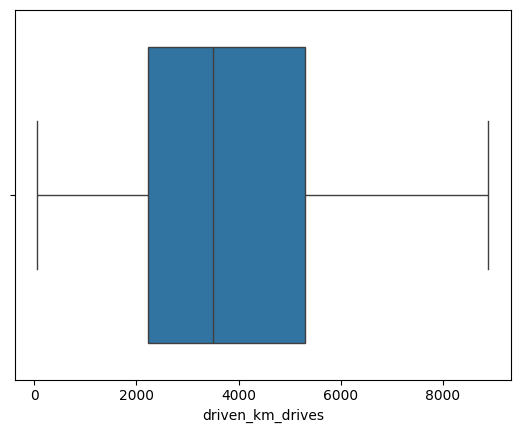

In [52]:
sns.boxplot(x=temp_nn_df['driven_km_drives'],
            showfliers=True)

In [53]:
label_order = ['churned', 'retained']


<Axes: xlabel='label', ylabel='driven_km_drives'>

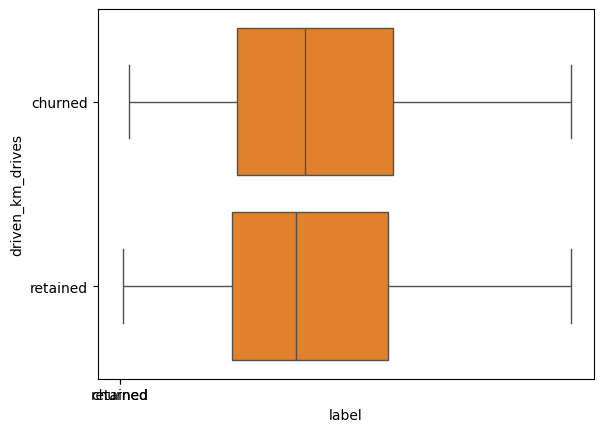

In [54]:
# box plot for "driven_km_drives"

# method 1:
# box plot in a vertical view
sns.boxplot(x=temp_nn_df['label'],
            y=temp_nn_df['driven_km_drives'],
            order = label_order,
            showfliers=True)

# method 2:
# create box plot in a different view; swapped x and y variables
# box plot in a horizontal view
sns.boxplot(x=temp_nn_df['driven_km_drives'],
            y=temp_nn_df['label'],
            order = label_order,
            showfliers=True)

In [55]:
final_df = not_null_df.copy()
final_df

,ID,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device,monthly_drives_per_session_ratio
0,0,retained,243,201,296.748273,2276,208,0,2628.845068,1985.775061,28,19,Android,0.827160
1,1,retained,133,107,326.896596,1225,19,64,8889.794236,3160.472914,13,11,iPhone,0.804511
2,2,retained,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,Android,0.833333
3,3,retained,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,iPhone,0.816327
4,4,retained,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,Android,0.809524
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,14994,retained,60,55,207.875622,140,317,0,2890.496901,2186.155708,25,17,iPhone,0.916667
14995,14995,retained,42,35,187.670313,2505,15,10,4062.575194,1208.583193,25,20,Android,0.833333
14996,14996,retained,243,201,422.017241,1873,17,0,3097.825028,1031.278706,18,17,iPhone,0.827160
14997,14997,churned,149,120,180.524184,3150,45,0,4051.758549,254.187763,6,6,iPhone,0.805369


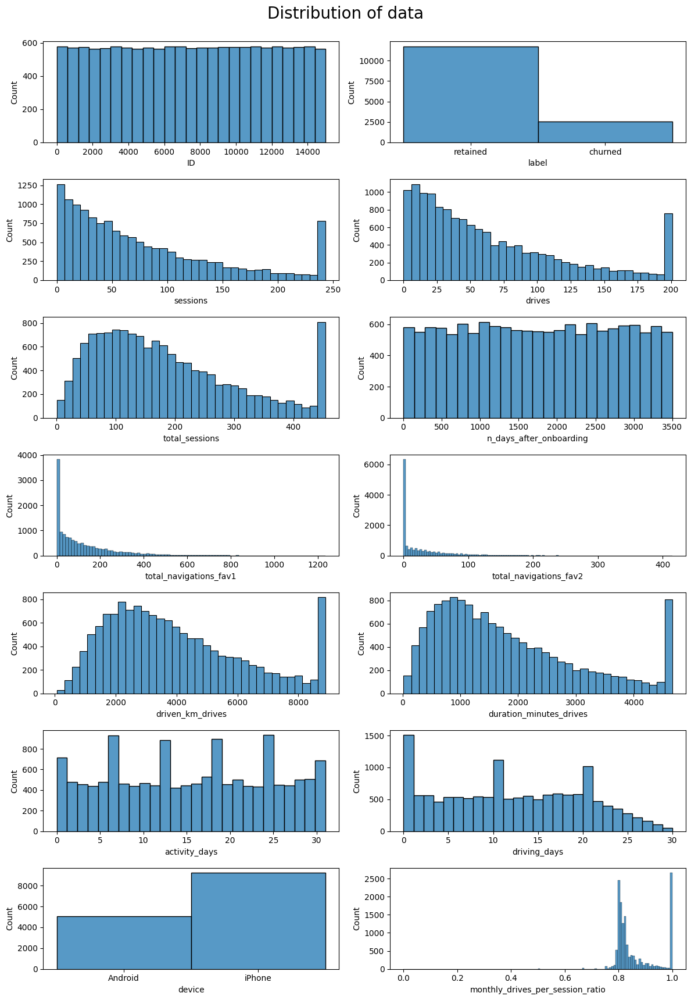

In [56]:
# histograms
# Set the number of columns and calculate the number of rows based on the number of columns
ncols = 2

nrows = np.ceil(len(final_df.columns)/ncols).astype(int)
fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(12,nrows*2.5))
for c, ax in zip(final_df.columns, axs.flatten()):
    sns.histplot(final_df, x=c, ax=ax)

# Set the super title for the entire set of subplots
fig.suptitle('Distribution of data', fontsize=20)

plt.tight_layout(rect=[0, 0, 1, 0.98])

**Perform feature engineering**



In [57]:
# feature selection

# remote the the "ID" column from the dataframe by dropping it
final_df = final_df.drop('ID', axis=1)
# feature extraction

# create `km_per_driving_day` column
final_df['km_per_driving_day'] = final_df['driven_km_drives'] / final_df['driving_days']
final_df['km_per_driving_day'].describe()

# imputes a value of infinity with 0
final_df.loc[final_df['km_per_driving_day']==np.inf, 'km_per_driving_day'] = 0

final_df['km_per_driving_day'].describe()

,km_per_driving_day
count,14299.000000
mean,566.943907
std,969.897544
min,0.000000
25%,136.168003
50%,273.301012
75%,543.473676
max,8889.794236


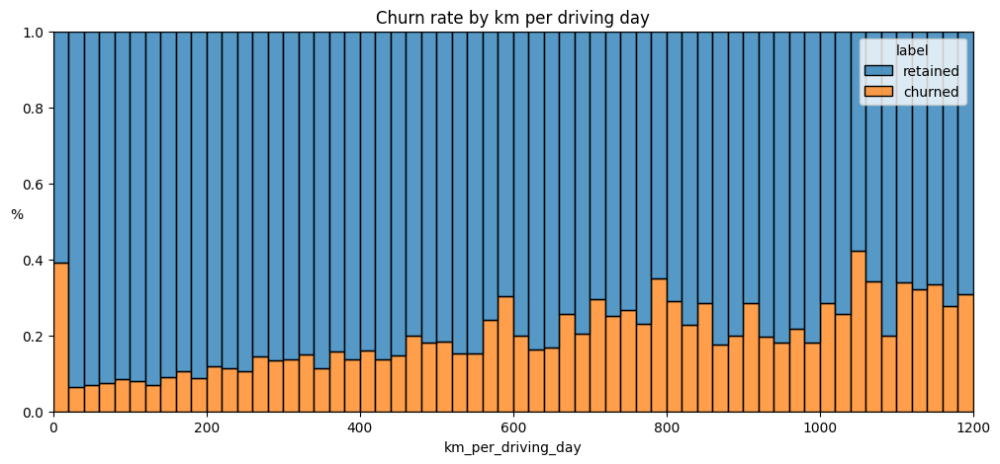

In [58]:
# Histogram

plt.figure(figsize=(12,5))
sns.histplot(data=final_df,
             x='km_per_driving_day',
             bins=range(0,1201,20),#1201 size of the bin limits the km per driving day > 1200
             hue='label',
             multiple='fill')
plt.ylabel('%', rotation=0)
plt.title('Churn rate by km per driving day');

The longer the distance users drove in a day, the churn rate increased. maybe they did not receice the good rewards!

In [59]:
# feature extraction

# create `professional_driver` column
final_df['professional_driver'] = np.where((final_df['drives'] >= 60) & (final_df['driving_days'] >= 15), 1, 0)
# feature extraction

# count the number of professionals and non-professionals
print(final_df['professional_driver'].value_counts())

print()

# verify churn rate by type
final_df.groupby(['professional_driver'])['label'].value_counts(normalize=True)

professional_driver
0    11811
1     2488
Name: count, dtype: int64



professional_driver  label   
0                    retained    0.801202
                     churned     0.198798
1                    retained    0.924437
                     churned     0.075563
Name: proportion, dtype: float64

In [60]:
# feature transformation

print("BEFORE:")

print("values: ", final_df['label'].unique())
print("dtype: ", final_df['label'].dtype)

# data transformation
final_df['label'] = final_df['label'].replace({'retained': 0, 'churned': 1})

print()

print("AFTER:")

print("values: ", final_df['label'].unique())
print("dtype: ", final_df['label'].dtype)

BEFORE:
values:  ['retained' 'churned']
dtype:  object

AFTER:
values:  [0 1]
dtype:  int64


<ipython-input-60-115ac05773b4>:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  final_df['label'] = final_df['label'].replace({'retained': 0, 'churned': 1})


In [61]:
#feature transformation

print("BEFORE:")

print("values: ", final_df['device'].unique())
print("dtype: ", final_df['device'].dtype)

# data transformation
final_df['device'] = final_df['device'].replace({'Android': 0, 'iPhone': 1})

print()

print("AFTER:")

print("values: ", final_df['label'].unique())
print("dtype: ", final_df['label'].dtype)

BEFORE:
values:  ['Android' 'iPhone']
dtype:  object

AFTER:
values:  [0 1]
dtype:  int64


<ipython-input-61-d4a9a2a5a840>:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  final_df['device'] = final_df['device'].replace({'Android': 0, 'iPhone': 1})


In [62]:
final_df.head(5)

,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device,monthly_drives_per_session_ratio,km_per_driving_day,professional_driver
0,0,243,201,296.748273,2276,208,0,2628.845068,1985.775061,28,19,0,0.827160,138.360267,1
1,0,133,107,326.896596,1225,19,64,8889.794236,3160.472914,13,11,1,0.804511,808.163112,0
2,0,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,0,0.833333,382.393602,0
3,0,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,1,0.816327,304.530374,0
4,0,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,0,0.809524,219.455667,1


In [63]:
final_df.dtypes.sort_values(ascending=False)


,0
total_sessions,float64
driven_km_drives,float64
duration_minutes_drives,float64
monthly_drives_per_session_ratio,float64
km_per_driving_day,float64
label,int64
sessions,int64
drives,int64
n_days_after_onboarding,int64
total_navigations_fav1,int64


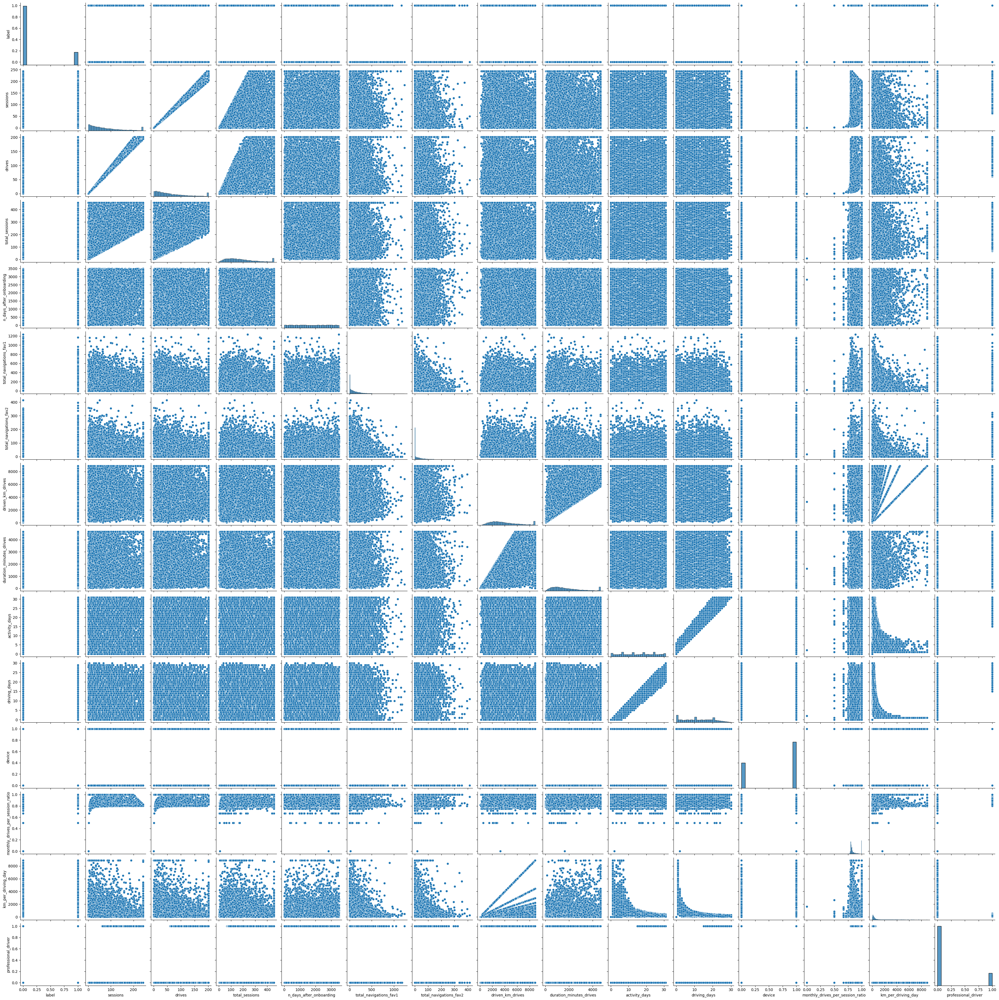

In [64]:
sns.pairplot(final_df);


Identified 700 rows of missing values in y-target variable, "lable" and decided to slice the dataset into two subsets, null_df and not_null_df

Identified outliers in 3 features below, but no action was taken on those features:
       'driven_km_drives'

       'drives'

       'driving_days'


# Descriptive Statistics

In [66]:
# import additional packages

# For plotting histograms
import matplotlib.pyplot as plt

# Open source module designed specifically for statistics; necessary for visualize data, hypothesis testing and more
from scipy import stats

# Python package used to explore data, work with statistical models, and perform statistical tests
import statsmodels.api as sm

In [67]:
df.describe(include = 'all')

,ID,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device,monthly_drives_per_session_ratio
count,14999.000000,14299,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999,14894.000000
unique,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN
top,NaN,retained,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,iPhone,NaN
freq,NaN,11763,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9672,NaN
mean,7499.000000,NaN,76.568705,64.058204,184.031320,1749.837789,121.605974,29.672512,3939.632764,1789.647426,15.537102,12.179879,NaN,0.860566
std,4329.982679,NaN,67.297958,55.306924,118.600463,1008.513876,148.121544,45.394651,2216.041510,1222.705167,9.004655,7.824036,NaN,0.077298
min,0.000000,NaN,0.000000,0.000000,0.220211,4.000000,0.000000,0.000000,60.441250,18.282082,0.000000,0.000000,NaN,0.000000
25%,3749.500000,NaN,23.000000,20.000000,90.661156,878.000000,9.000000,0.000000,2212.600607,835.996260,8.000000,5.000000,NaN,0.805263
50%,7499.000000,NaN,56.000000,48.000000,159.568115,1741.000000,71.000000,9.000000,3493.858085,1478.249859,16.000000,12.000000,NaN,0.826087
75%,11248.500000,NaN,112.000000,93.000000,254.192341,2623.500000,178.000000,43.000000,5289.861262,2464.362632,23.000000,19.000000,NaN,0.900000



driven km drives_mean:  3939.632763521272
driven km drives_median:  3493.858085
driven km drives_std:  2216.041510377201

% data within the 1σ interval 67.04446963130876
% data within the 2σ interval 93.48623241549436
% data within the 3σ interval 100.0


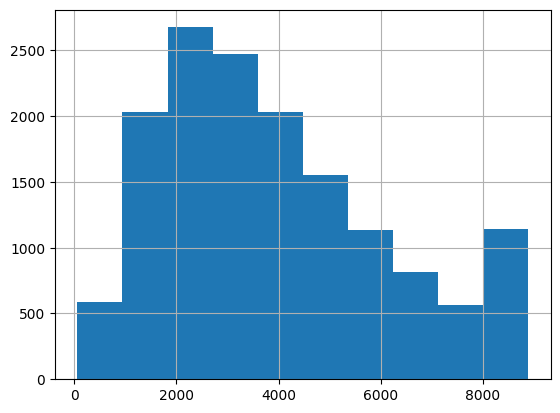

In [68]:
# 1. plot a histogram
df['driven_km_drives'].hist()

print()

# 2. generate descriptive statistics
mean_driven_km_drives = df['driven_km_drives'].mean()
print("driven km drives_mean: ", mean_driven_km_drives)

median_driven_km_drives = df['driven_km_drives'].median()
print("driven km drives_median: ", median_driven_km_drives)

std_driven_km_drives = df['driven_km_drives'].std()
print("driven km drives_std: ", std_driven_km_drives)

print()

# 3. compare the distribution against the empirical rule
# how much % of data is within the 1σ interval?
lower_limit = mean_driven_km_drives - 1 * std_driven_km_drives
upper_limit = mean_driven_km_drives + 1 * std_driven_km_drives
print("% data within the 1σ interval", ((df['driven_km_drives'] >= lower_limit) & (df['driven_km_drives'] <= upper_limit)).mean()*100)

# how much % of data is within the 2σ interval?
lower_limit = mean_driven_km_drives - 2 * std_driven_km_drives
upper_limit = mean_driven_km_drives + 2 * std_driven_km_drives
print("% data within the 2σ interval", ((df['driven_km_drives'] >= lower_limit) & (df['driven_km_drives'] <= upper_limit)).mean()*100)

# how much % of data is within the 3σ interval?
lower_limit = mean_driven_km_drives - 3 * std_driven_km_drives
upper_limit = mean_driven_km_drives + 3 * std_driven_km_drives
print("% data within the 3σ interval", ((df['driven_km_drives'] >= lower_limit) & (df['driven_km_drives'] <= upper_limit)).mean()*100)


drives_mean:  64.05820388025869
drives_median:  48.0
drives_std:  55.30692415947687

% data within the 1σ interval 72.56483765584373
% data within the 2σ interval 92.80618707913861
% data within the 3σ interval 100.0


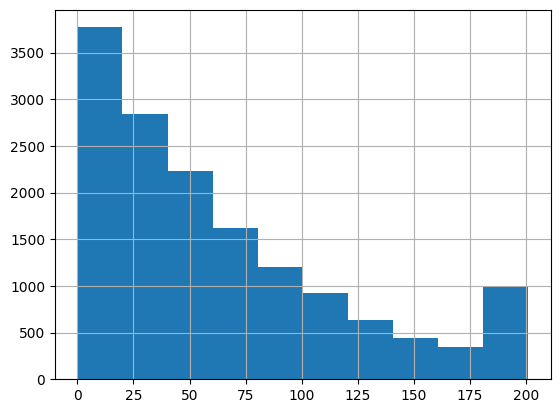

In [69]:
# 1. plot a histogram
df['drives'].hist()

print()

# 2. generate descriptive statistics
mean_drives = df['drives'].mean()
print("drives_mean: ", mean_drives)

median_drives = df['drives'].median()
print("drives_median: ", median_drives)

std_drives = df['drives'].std()
print("drives_std: ", std_drives)

print()

# 3. compare the distribution against the empirical rule
# how much % of data is within the 1σ interval?
lower_limit = mean_drives - 1 * std_drives
upper_limit = mean_drives + 1 * std_drives
print("% data within the 1σ interval", ((df['drives'] >= lower_limit) & (df['drives'] <= upper_limit)).mean()*100)

# how much % of data is within the 2σ interval?
lower_limit = mean_drives - 2 * std_drives
upper_limit = mean_drives + 2 * std_drives
print("% data within the 2σ interval", ((df['drives'] >= lower_limit) & (df['drives'] <= upper_limit)).mean()*100)

# how much % of data is within the 3σ interval?
lower_limit = mean_drives - 3 * std_drives
upper_limit = mean_drives + 3 * std_drives
print("% data within the 3σ interval", ((df['drives'] >= lower_limit) & (df['drives'] <= upper_limit)).mean()*100)

 Identify outliers using Z-score

In [70]:
# make a copy of df to preserve the preserve the dataframe
temp_df = df.copy()
# calculate Z-score to identify outliers
temp_df['Z_SCORE_01'] = stats.zscore(temp_df['driven_km_drives'])
temp_df

,ID,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device,monthly_drives_per_session_ratio,Z_SCORE_01
0,0,retained,243,201,296.748273,2276,208,0,2628.845068,1985.775061,28,19,Android,0.827160,-0.591519
1,1,retained,133,107,326.896596,1225,19,64,8889.794236,3160.472914,13,11,iPhone,0.804511,2.233860
2,2,retained,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,Android,0.833333,-0.397336
3,3,retained,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,iPhone,0.816327,-1.365562
4,4,retained,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,Android,0.809524,0.004770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,14994,retained,60,55,207.875622,140,317,0,2890.496901,2186.155708,25,17,iPhone,0.916667,-0.473444
14995,14995,retained,42,35,187.670313,2505,15,10,4062.575194,1208.583193,25,20,Android,0.833333,0.055480
14996,14996,retained,243,201,422.017241,1873,17,0,3097.825028,1031.278706,18,17,iPhone,0.827160,-0.379883
14997,14997,churned,149,120,180.524184,3150,45,0,4051.758549,254.187763,6,6,iPhone,0.805369,0.050599


# Build a regression model

In [74]:
# Packages for numerics + dataframes
import pandas as pd
import numpy as np

# Packages for visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Packages for Logistic Regression & Confusion Matrix
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, precision_score, \
recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression

In [75]:
df = pd.read_csv('/content/drive/My Drive/waze_dataset.csv')


In [76]:
df = df.drop('ID', axis=1)
df['label'].value_counts(normalize=True)

,proportion
label,
retained,0.822645
churned,0.177355


Create a new column in df called km_per_driving_day, which represents the mean distance driven per driving day for each user.

Call the describe() method on the new column

In [77]:
# 1. Create `km_per_driving_day` column
df['km_per_driving_day'] = df['driven_km_drives'] / df['driving_days']

# 2. Call `describe()` on the new column
df['km_per_driving_day'].describe()

,km_per_driving_day
count,1.499900e+04
mean,inf
std,NaN
min,3.022063e+00
25%,1.672804e+02
50%,3.231459e+02
75%,7.579257e+02
max,inf


In [78]:
# 1. Convert infinite values to zero
df.loc[df['km_per_driving_day']==np.inf, 'km_per_driving_day'] = 0

# 2. Confirm that it worked
df['km_per_driving_day'].describe()

,km_per_driving_day
count,14999.000000
mean,578.963113
std,1030.094384
min,0.000000
25%,136.238895
50%,272.889272
75%,558.686918
max,15420.234110


In [79]:
# Create `professional_driver` column
df['professional_driver'] = np.where((df['drives'] >= 60) & (df['driving_days'] >= 15), 1, 0)

In [80]:
# 1. Check count of professionals and non-professionals
print(df['professional_driver'].value_counts())

# 2. Check in-class churn rate
df.groupby(['professional_driver'])['label'].value_counts(normalize=True)

professional_driver
0    12405
1     2594
Name: count, dtype: int64


professional_driver  label   
0                    retained    0.801202
                     churned     0.198798
1                    retained    0.924437
                     churned     0.075563
Name: proportion, dtype: float64

In [81]:
# Drop rows with missing data in `label` column
df = df.dropna(subset=['label'])

In [83]:
numeric_df = df.select_dtypes(include=['number'])
correlation_matrix = numeric_df.corr(method='pearson')
correlation_matrix

,ID,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days
ID,1.000000,0.011240,0.010470,0.002909,-0.005673,-0.000606,-0.000771,-0.003561,-0.001594,-0.001887,-0.001808
sessions,0.011240,1.000000,0.996822,0.589079,0.005676,0.005713,0.006185,0.002113,-0.006113,0.024194,0.018973
drives,0.010470,0.996822,1.000000,0.586741,0.005216,0.005017,0.007572,0.001883,-0.005855,0.024043,0.018847
total_sessions,0.002909,0.589079,0.586741,1.000000,0.004731,0.002137,0.006421,-0.000416,-0.001689,0.013449,0.009912
n_days_after_onboarding,-0.005673,0.005676,0.005216,0.004731,1.000000,0.000435,-0.008075,-0.003213,-0.009646,-0.009725,-0.008563
total_navigations_fav1,-0.000606,0.005713,0.005017,0.002137,0.000435,1.000000,0.002306,-0.007690,0.002097,0.011066,0.010359
total_navigations_fav2,-0.000771,0.006185,0.007572,0.006421,-0.008075,0.002306,1.000000,0.000081,-0.004091,-0.004036,0.001951
driven_km_drives,-0.003561,0.002113,0.001883,-0.000416,-0.003213,-0.007690,0.000081,1.000000,0.697866,-0.002601,-0.005487
duration_minutes_drives,-0.001594,-0.006113,-0.005855,-0.001689,-0.009646,0.002097,-0.004091,0.697866,1.000000,-0.002830,-0.005145
activity_days,-0.001887,0.024194,0.024043,0.013449,-0.009725,0.011066,-0.004036,-0.002601,-0.002830,1.000000,0.947706


In [90]:
# Create binary `label2` column
df['label2'] = np.where(df['label']=='churned', 1, 0)
df[['label', 'label2']].tail()

,label,label2
14994,retained,0
14995,retained,0
14996,retained,0
14997,churned,1
14998,retained,0


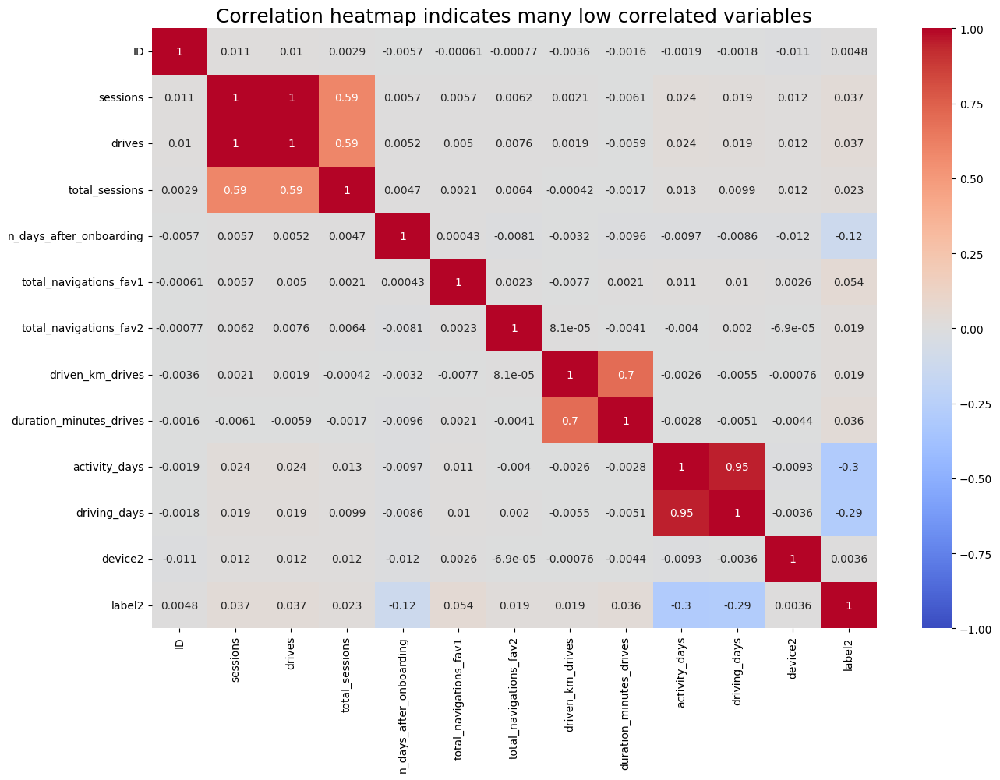

In [95]:
# Plot correlation heatmap
plt.figure(figsize=(15,10))
sns.heatmap(numeric_df.corr(method='pearson'), vmin=-1, vmax=1, annot=True, cmap='coolwarm')
plt.title('Correlation heatmap indicates many low correlated variables',
          fontsize=18)
plt.show();

If there are predictor variables that have a Pearson correlation coefficient value greater than the absolute value of 0.7, these variables are strongly multicollinear. Therefore, only one of these variables should be used in your model.

In [92]:
# Create new `device2` variable
df['device2'] = np.where(df['device']=='Android', 0, 1)
df[['device', 'device2']].tail()


,device,device2
14994,iPhone,1
14995,Android,0
14996,iPhone,1
14997,iPhone,1
14998,iPhone,1


In [93]:
# Isolate predictor variables
X = df.drop(columns = ['label', 'label2', 'device', 'sessions', 'driving_days'])

In [94]:
numeric_df = df.select_dtypes(include=['number'])
correlation_matrix = numeric_df.corr(method='pearson')
correlation_matrix

,ID,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device2,label2
ID,1.000000,0.011240,0.010470,0.002909,-0.005673,-0.000606,-0.000771,-0.003561,-0.001594,-0.001887,-0.001808,-0.011270,0.004777
sessions,0.011240,1.000000,0.996822,0.589079,0.005676,0.005713,0.006185,0.002113,-0.006113,0.024194,0.018973,0.012443,0.036923
drives,0.010470,0.996822,1.000000,0.586741,0.005216,0.005017,0.007572,0.001883,-0.005855,0.024043,0.018847,0.011815,0.037296
total_sessions,0.002909,0.589079,0.586741,1.000000,0.004731,0.002137,0.006421,-0.000416,-0.001689,0.013449,0.009912,0.011665,0.022915
n_days_after_onboarding,-0.005673,0.005676,0.005216,0.004731,1.000000,0.000435,-0.008075,-0.003213,-0.009646,-0.009725,-0.008563,-0.012044,-0.124711
total_navigations_fav1,-0.000606,0.005713,0.005017,0.002137,0.000435,1.000000,0.002306,-0.007690,0.002097,0.011066,0.010359,0.002575,0.054237
total_navigations_fav2,-0.000771,0.006185,0.007572,0.006421,-0.008075,0.002306,1.000000,0.000081,-0.004091,-0.004036,0.001951,-0.000069,0.019121
driven_km_drives,-0.003561,0.002113,0.001883,-0.000416,-0.003213,-0.007690,0.000081,1.000000,0.697866,-0.002601,-0.005487,-0.000761,0.019441
duration_minutes_drives,-0.001594,-0.006113,-0.005855,-0.001689,-0.009646,0.002097,-0.004091,0.697866,1.000000,-0.002830,-0.005145,-0.004409,0.035698
activity_days,-0.001887,0.024194,0.024043,0.013449,-0.009725,0.011066,-0.004036,-0.002601,-0.002830,1.000000,0.947706,-0.009296,-0.295190


In [96]:
# Isolate target variable
y = df['label2']

Split the data
Use scikit-learn's train_test_split() function to perform a train/test split on your data using the X and y variables you assigned above.

Note 1: It is important to do a train test to obtain accurate predictions. You always want to fit your model on your training set and evaluate your model on your test set to avoid data leakage.

Note 2: Because the target class is imbalanced (82% retained vs. 18% churned), you want to make sure that you don't get an unlucky split that over- or under-represents the frequency of the minority class. Set the function's stratify parameter to y to ensure that the minority class appears in both train and test sets in the same proportion that it does in the overall dataset.

In [97]:
# Perform the train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)
# Use .head()
X_train.head()

,ID,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,device2
3483,3483,50,90.468920,1039,0,15,6558.564887,1501.683515,2,0
13354,13354,45,243.720232,1480,0,35,5657.864872,4660.502879,13,0
6059,6059,48,61.511644,737,362,3,2575.235783,1407.662881,16,0
198,198,13,186.979465,3306,184,32,905.681067,299.016399,10,0
12381,12381,2,124.305442,802,0,0,2813.451801,2021.436512,0,1


Use scikit-learn to instantiate a logistic regression model. Add the argument penalty = None.

It is important to add penalty = 'none' since your predictors are unscaled.

Refer to scikit-learn's logistic regression documentation for more information.

Fit the model on X_train and y_train

In [99]:
# Perform the train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)
# Use .head()
X_train.head()

,ID,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,device2
3483,3483,50,90.468920,1039,0,15,6558.564887,1501.683515,2,0
13354,13354,45,243.720232,1480,0,35,5657.864872,4660.502879,13,0
6059,6059,48,61.511644,737,362,3,2575.235783,1407.662881,16,0
198,198,13,186.979465,3306,184,32,905.681067,299.016399,10,0
12381,12381,2,124.305442,802,0,0,2813.451801,2021.436512,0,1


In [101]:
model = LogisticRegression(penalty=None, max_iter=400) # Change 'none' to None

model.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(max_iter=400, penalty=None)

Call the .coef_ attribute on the model to get the coefficients of each variable. The coefficients are in order of how the variables are listed in the dataset. Remember that the coefficients represent the change in the log odds of the target variable for every one unit increase in X.​If you want, create a series whose index is the column names and whose values are the coefficients in model.coef_.

In [102]:
pd.Series(model.coef_[0], index=X.columns)


,0
ID,0.000004
drives,0.002119
total_sessions,-0.000106
n_days_after_onboarding,-0.000383
total_navigations_fav1,0.001030
total_navigations_fav2,0.001229
driven_km_drives,-0.000019
duration_minutes_drives,0.000095
activity_days,-0.101720
device2,-0.049150


In [103]:
model.intercept_

array([-0.03333905])

Validate model assumptions

Check final assumption
Verify the linear relationship between X and the estimated log odds (known as logits) by making a regplot.

Call the model's predict_proba() method to generate the probability of response for each sample in the training data. (The training data is the argument to the method.) Assign the result to a variable called training_probabilities. This results in a 2-D array where each row represents a user in X_train. The first column is the probability of the user not churning, and the second column is the probability of the user churning.

In [104]:
# Get the predicted probabilities of the training data
training_probabilities = model.predict_proba(X_train)
training_probabilities

array([[0.62008191, 0.37991809],
       [0.80577258, 0.19422742],
       [0.79625474, 0.20374526],
       ...,
       [0.82918086, 0.17081914],
       [0.95676291, 0.04323709],
       [0.86460153, 0.13539847]])

In [105]:
# 1. Copy the `X_train` dataframe and assign to `logit_data`
logit_data = X_train.copy()

# 2. Create a new `logit` column in the `logit_data` df
logit_data['logit'] = [np.log(prob[1] / prob[0]) for prob in training_probabilities]

Plot a regplot where the x-axis represents an independent variable and the y-axis represents the log-odds of the predicted probabilities.

In an exhaustive analysis, this would be plotted for each continuous or discrete predictor variable. Here we show only driving_days.

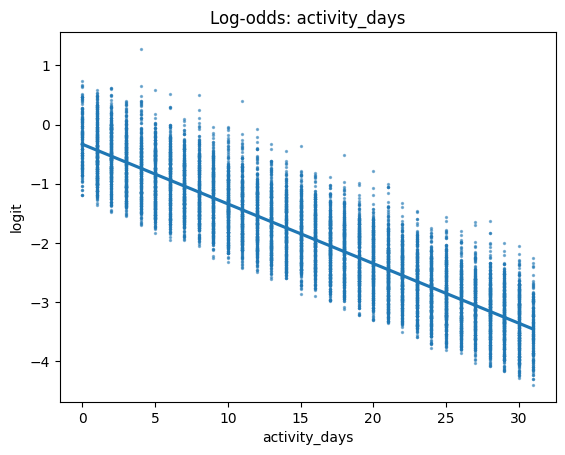

In [106]:
# Plot regplot of `activity_days` log-odds
sns.regplot(x='activity_days', y='logit', data=logit_data, scatter_kws={'s': 2, 'alpha': 0.5})
plt.title('Log-odds: activity_days');

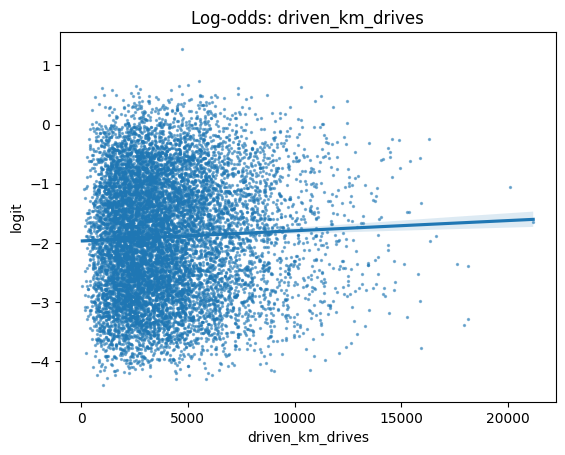

In [107]:
# plot a regplot where the x-axis represents an independent variable and the y-axis represents the log-odds of the predicted probabilities.
# X-predictor variables: 'driven_km_drives', 'drives', 'driving_days', 'device', 'km_per_driving_day', 'professional_driver'

# 'driven_km_drives'
sns.regplot(x='driven_km_drives', y='logit', data=logit_data, scatter_kws={'s': 2, 'alpha': 0.5})
plt.title('Log-odds: driven_km_drives');

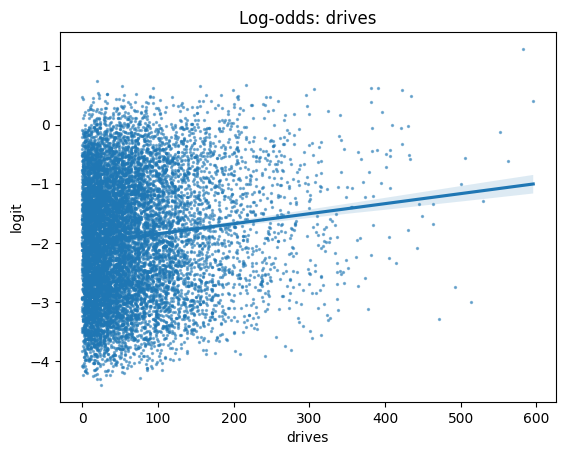

In [111]:
sns.regplot(x='drives', y='logit', data=logit_data, scatter_kws={'s': 2, 'alpha': 0.5})
plt.title('Log-odds: drives');

# Predictions

In [115]:
# generate predictions on X_test
y_preds = model.predict(X_test)
# importing the 'shap' module for generating SHAP summary plots
import shap

explainer = shap.LinearExplainer(model, X_train)
shap_values = explainer.shap_values(X_test)

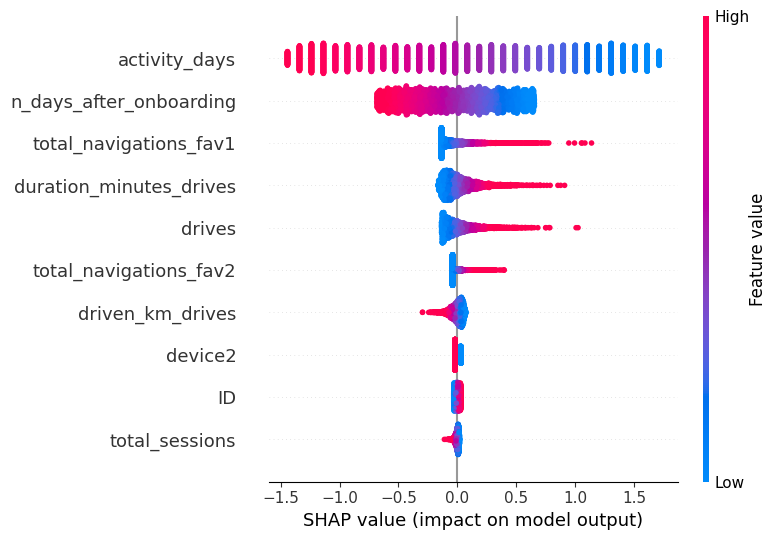

In [116]:
# Summary plot
shap.summary_plot(shap_values, X_test, feature_names=X.columns)

# Individual instance plot (for a specific data point)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0], X_test.iloc[0])

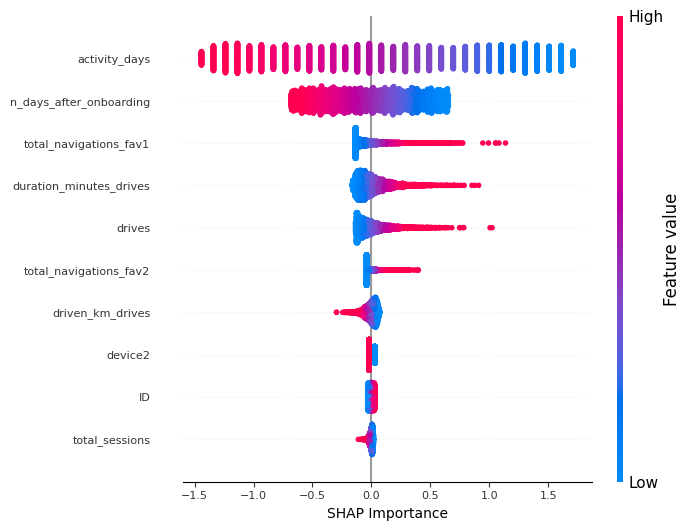

In [117]:
# importing the 'shap' module for generating SHAP summary plots
import shap

# Creating a summary plot of the SHAP values using the 'summary_plot' function
shap.summary_plot(shap_values,
                  X_test,
                  #plot_type="bar", # specify the type of plot as a bar chart
                  feature_names=X.columns, # The feature names
                  max_display=10,
                  show=False # suppress the automatic display of the plot
                 )

# Customizing the font size of the x and y ticks in the plot
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

# Adding a label to the x-axis
plt.xlabel("SHAP Importance", fontsize=10)

# Displaying the plot
plt.show()

**Results and evaluation**

In [119]:
# Generate predictions on X_test
y_preds = model.predict(X_test)
# Score the model (accuracy) on the test data
model.score(X_test, y_test)

0.832

Show results with a confusion matrix

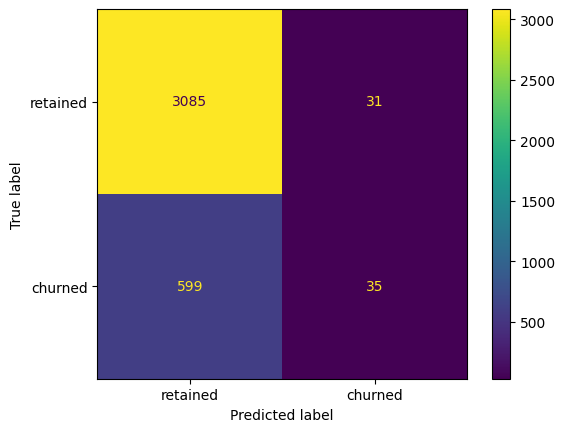

In [120]:
cm = confusion_matrix(y_test, y_preds)
#Next, use the ConfusionMatrixDisplay() function to display the confusion matrix from the above cell, passing the confusion matrix you just created as its argument.

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=['retained', 'churned'],
                              )
disp.plot();

In [121]:
# Calculate precision manually
precision = cm[1,1] / (cm[0, 1] + cm[1, 1])
precision

0.5303030303030303

In [122]:
# Calculate recall manually
recall = cm[1,1] / (cm[1, 0] + cm[1, 1])
recall

0.055205047318611984

In [123]:
# Create a classification report
target_labels = ['retained', 'churned']
print(classification_report(y_test, y_preds, target_names=target_labels))

              precision    recall  f1-score   support

    retained       0.84      0.99      0.91      3116
     churned       0.53      0.06      0.10       634

    accuracy                           0.83      3750
   macro avg       0.68      0.52      0.50      3750
weighted avg       0.79      0.83      0.77      3750



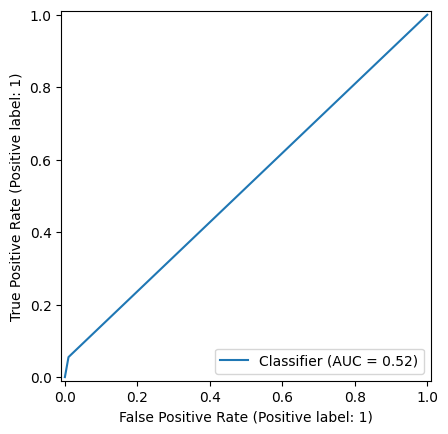

In [124]:
# generate ROC curves

import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_predictions(y_test, y_preds)
plt.show()

In [125]:
np.unique(y_preds)


array([0, 1])

In [126]:
# Create a list of (column_name, coefficient) tuples
feature_importance = list(zip(X_train.columns, model.coef_[0]))

# Sort the list by coefficient value
feature_importance = sorted(feature_importance, key=lambda x: x[1], reverse=True)
feature_importance

[('drives', 0.0021191361226337627),
 ('total_navigations_fav2', 0.0012294055583579862),
 ('total_navigations_fav1', 0.001030020126479288),
 ('duration_minutes_drives', 9.506610349364824e-05),
 ('ID', 3.990150986179143e-06),
 ('driven_km_drives', -1.934048286513366e-05),
 ('total_sessions', -0.00010587350683805244),
 ('n_days_after_onboarding', -0.0003828169496885944),
 ('device2', -0.049150001888481606),
 ('activity_days', -0.1017203833443463)]

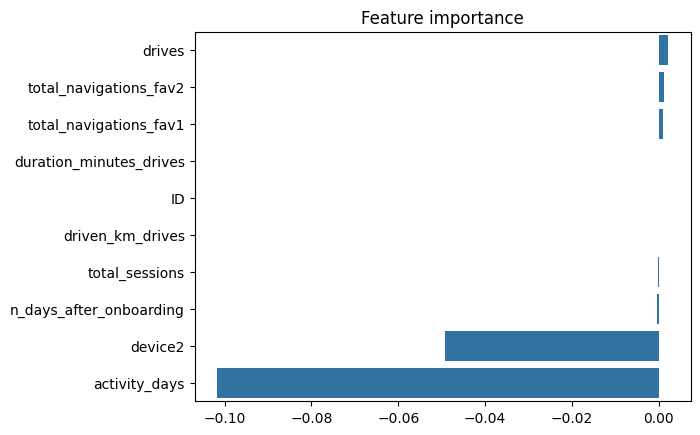

In [127]:
# Plot the feature importances
import seaborn as sns
sns.barplot(x=[x[1] for x in feature_importance],
            y=[x[0] for x in feature_importance],
            orient='h')
plt.title('Feature importance');

ariables most influenced the model's prediction are:

The most influencial variable: "driving_days" has negative correlation with user churn

The second influencial variable: "drives" has positive correlation with user churn

Variables least influenced the model's predictions are:

"driven_km_drivers"

"total_sessions"

"km_per_driving_day"

Questions:

What variable most influenced the model's prediction? How? Was this surprising?
_activity_days was by far the most important feature in the model. It had a negative correlation with user churn. This was not surprising, as this variable was very strongly correlated with driving_days, which was known from EDA to have a negative correlation with churn._

Were there any variables that you expected to be stronger predictors than they were?
_Yes. In previous EDA, user churn rate increased as the values in km_per_driving_day increased. The correlation heatmap here in this notebook revealed this variable to have the strongest positive correlation with churn of any of the predictor variables by a relatively large margin. In the model, it was the second-least-important variable._

Why might a variable you thought to be important not be important in the model?
In a multiple logistic regression model, features can interact with each other and these interactions can result in seemingly counterintuitive relationships. This is both a strength and a weakness of predictive models, as capturing these interactions typically makes a model more predictive while at the same time making the model more difficult to explain.

Would you recommend that Waze use this model? Why or why not?
It depends. What would the model be used for? If it's used to drive consequential business decisions, then no. The model is not a strong enough predictor, as made clear by its poor recall score. However, if the model is only being used to guide further exploratory efforts, then it can have value.

What could you do to improve this model?
_New features could be engineered to try to generate better predictive signal, as they often do if you have domain knowledge. In the case of this model, one of the engineered features (professional_driver) was the third-most-predictive predictor. It could also be helpful to scale the predictor variables, and/or to reconstruct the model with different combinations of predictor variables to reduce noise from unpredictive features._

What additional features would you like to have to help improve the model?
It would be helpful to have drive-level information for each user (such as drive times, geographic locations, etc.). It would probably also be helpful to have more granular data to know how users interact with the app. For example, how often do they report or confirm road hazard alerts? Finally, it could be helpful to know the monthly count of unique starting and ending locations each driver inputs.

In [128]:
# Import packages for data manipulation
import numpy as np
import pandas as pd

# Import packages for data visualization
import matplotlib.pyplot as plt

# This lets us see all of the columns, preventing Juptyer from redacting them.
pd.set_option('display.max_columns', None)

# Import packages for data modeling
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.metrics import accuracy_score, precision_score, recall_score,\
f1_score, confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay, PrecisionRecallDisplay

from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# This is the function that helps plot feature importance
from xgboost import plot_importance

# This module lets us save our models once we fit them.
import pickle

In [129]:
# Import dataset
df0 = pd.read_csv('/content/drive/My Drive/waze_dataset.csv')
# Inspect the first five rows
df0.head()

,ID,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device
0,0,retained,283,226,296.748273,2276,208,0,2628.845068,1985.775061,28,19,Android
1,1,retained,133,107,326.896596,1225,19,64,13715.920550,3160.472914,13,11,iPhone
2,2,retained,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,Android
3,3,retained,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,iPhone
4,4,retained,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,Android


In [130]:
# Copy the df0 dataframe
df = df0.copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       14999 non-null  int64  
 1   label                    14299 non-null  object 
 2   sessions                 14999 non-null  int64  
 3   drives                   14999 non-null  int64  
 4   total_sessions           14999 non-null  float64
 5   n_days_after_onboarding  14999 non-null  int64  
 6   total_navigations_fav1   14999 non-null  int64  
 7   total_navigations_fav2   14999 non-null  int64  
 8   driven_km_drives         14999 non-null  float64
 9   duration_minutes_drives  14999 non-null  float64
 10  activity_days            14999 non-null  int64  
 11  driving_days             14999 non-null  int64  
 12  device                   14999 non-null  object 
dtypes: float64(3), int64(8), object(2)
memory usage: 1.5+ MB


km_per_driving_day
Create a feature representing the mean number of kilometers driven on each driving day in the last month for each user. Add this feature as a column to df.

Get descriptive statistics for this new feature

In [131]:
# 1. Create `km_per_driving_day` feature
df['km_per_driving_day'] = df['driven_km_drives'] / df['driving_days']

# 2. Get descriptive stats
df['km_per_driving_day'].describe()

,km_per_driving_day
count,1.499900e+04
mean,inf
std,NaN
min,3.022063e+00
25%,1.672804e+02
50%,3.231459e+02
75%,7.579257e+02
max,inf


Notice that some values are infinite. This is the result of there being values of zero in the driving_days column. Pandas imputes a value of infinity in the corresponding rows of the new column because division by zero is undefined.

Convert these values from infinity to zero. You can use np.inf to refer to a value of infinity.

Call describe() on the km_per_driving_day column to verify that it worked

In [132]:
# 1. Convert infinite values to zero
df.loc[df['km_per_driving_day']==np.inf, 'km_per_driving_day'] = 0

# 2. Confirm that it worked
df['km_per_driving_day'].describe()

,km_per_driving_day
count,14999.000000
mean,578.963113
std,1030.094384
min,0.000000
25%,136.238895
50%,272.889272
75%,558.686918
max,15420.234110


percent_sessions_in_last_month¶
Create a new column percent_sessions_in_last_month that represents the percentage of each user's total sessions that were logged in their last month of use.

Get descriptive statistics for this new feature

In [133]:
# 1. Create `percent_sessions_in_last_month` feature
df['percent_sessions_in_last_month'] = df['sessions'] / df['total_sessions']

# 2. Get descriptive stats
df['percent_sessions_in_last_month'].describe()

,percent_sessions_in_last_month
count,14999.000000
mean,0.449255
std,0.286919
min,0.000000
25%,0.196221
50%,0.423097
75%,0.687216
max,1.530637


professional_driver
Create a new, binary feature called professional_driver that is a 1 for users who had 60 or more drives **and** drove on 15+ days in the last month.

Note: The objective is to create a new feature that separates professional drivers from other drivers. In this scenario, domain knowledge and intuition are used to determine these deciding thresholds, but ultimately they are arbitrary.

To create this column, use the np.where() function. This function accepts as arguments:

A condition
What to return when the condition is true
What to return when the condition is false



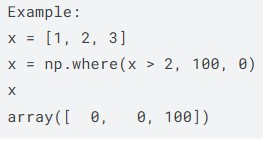

In [135]:
# Create `professional_driver` feature
df['professional_driver'] = np.where((df['drives'] >= 60) & (df['driving_days'] >= 15), 1, 0)
# total_sessions_per_day
#Now, create a new column that represents the mean number of sessions per day since onboarding.

# Create `total_sessions_per_day` feature
df['total_sessions_per_day'] = df['total_sessions'] / df['n_days_after_onboarding']
# Get descriptive stats
df['total_sessions_per_day'].describe()

,total_sessions_per_day
count,14999.000000
mean,0.338698
std,1.314333
min,0.000298
25%,0.051037
50%,0.100775
75%,0.216269
max,39.763874


km_per_hour¶
Create a column representing the mean kilometers per hour driven in the last month.

In [136]:
# Create `km_per_hour` feature
df['km_per_hour'] = df['driven_km_drives'] / (df['duration_minutes_drives'] / 60)
df['km_per_hour'].describe()

,km_per_hour
count,14999.000000
mean,190.394608
std,334.674026
min,72.013095
25%,90.706222
50%,122.382022
75%,193.130119
max,23642.920871


These numbers are obviously problematic, and it would be worthwhile to seek clarification from Waze regarding how these features are collected to better understand why such unrealistic speeds are observed.

km_per_drive
Create a column representing the mean number of kilometers per drive made in the last month for each user. Then, print descriptive statistics for the feature.

In [137]:
# Create `km_per_drive` feature
df['km_per_drive'] = df['driven_km_drives'] / df['drives']
df['km_per_drive'].describe()

,km_per_drive
count,1.499900e+04
mean,inf
std,NaN
min,1.008775e+00
25%,3.323065e+01
50%,7.488006e+01
75%,1.854667e+02
max,inf


In [138]:
# 1. Convert infinite values to zero
df.loc[df['km_per_drive']==np.inf, 'km_per_drive'] = 0

# 2. Confirm that it worked
df['km_per_drive'].describe()

,km_per_drive
count,14999.000000
mean,232.817946
std,620.622351
min,0.000000
25%,32.424301
50%,72.854343
75%,179.347527
max,15777.426560


percent_of_sessions_to_favorite¶
Finally, create a new column that represents the percentage of total sessions that were used to navigate to one of the users' favorite places. Then, print descriptive statistics for the new column.

This is a proxy representation for the percent of overall drives that are to a favorite place. Since total drives since onboarding are not contained in this dataset, total sessions must serve as a reasonable approximation.

People whose drives to non-favorite places make up a higher percentage of their total drives might be less likely to churn, since they're making more drives to less familiar places.

In [139]:
# Create `percent_of_sessions_to_favorite` feature
df['percent_of_drives_to_favorite'] = (
    df['total_navigations_fav1'] + df['total_navigations_fav2']) / df['total_sessions']

# Get descriptive stats
df['percent_of_drives_to_favorite'].describe()

,percent_of_drives_to_favorite
count,14999.000000
mean,1.665439
std,8.865666
min,0.000000
25%,0.203471
50%,0.649818
75%,1.638526
max,777.563629


Drop missing values
Because you know from previous EDA that there is no evidence of a non-random cause of the 700 missing values in the label column, and because these observations comprise less than 5% of the data, use the dropna() method to drop the rows that are missing this data.



In [140]:
# Drop rows with missing values
df = df.dropna(subset=['label'])

In [141]:
# Create new `device2` variable
df['device2'] = np.where(df['device']=='Android', 0, 1)
df[['device', 'device2']].tail()

,device,device2
14994,iPhone,1
14995,Android,0
14996,iPhone,1
14997,iPhone,1
14998,iPhone,1


In [142]:
# Create binary `label2` column
df['label2'] = np.where(df['label']=='churned', 1, 0)
df[['label', 'label2']].tail()

,label,label2
14994,retained,0
14995,retained,0
14996,retained,0
14997,churned,1
14998,retained,0


In [143]:
# Drop `ID` column
df = df.drop(['ID'], axis=1)

**Evaluation metric**

In [144]:
# Get class balance of 'label' col
df['label'].value_counts(normalize=True)

,proportion
label,
retained,0.822645
churned,0.177355


In [145]:
# 1. Isolate X variables
X = df.drop(columns=['label', 'label2', 'device'])

# 2. Isolate y variable
y = df['label2']

# 3. Split into train and test sets
X_tr, X_test, y_tr, y_test = train_test_split(X, y, stratify=y,
                                              test_size=0.2, random_state=42)

# 4. Split into train and validate sets
X_train, X_val, y_train, y_val = train_test_split(X_tr, y_tr, stratify=y_tr,
                                                  test_size=0.25, random_state=42)

In [146]:
for x in [X_train, X_val, X_test]:
    print(len(x))

8579
2860
2860


egin with using GridSearchCV to tune a random forest model.

Instantiate the random forest classifier rf and set the random state.

Create a dictionary cv_params of any of the following hyperparameters and their corresponding values to tune. The more you tune, the better your model will fit the data, but the longer it will take.

max_depth
max_features
max_samples
min_samples_leaf
min_samples_split
n_estimators
Define a set scoring of scoring metrics for GridSearch to capture (precision, recall, F1 score, and accuracy).

Instantiate the GridSearchCV object rf_cv. Pass to it as arguments:

estimator=rf
param_grid=cv_params
scoring=scoring
cv: define the number of cross-validation folds you want (cv=_)
refit: indicate which evaluation metric you want to use to select the model (refit=_)
refit should be set to 'recall'.

Note: To save time, this exemplar doesn't use multiple values for each parameter in the grid search, but you should include a range of values in your search to home in on the best set of parameters.

In [150]:
# 1. Instantiate the random forest classifier
rf = RandomForestClassifier(random_state=42)

# 2. Create a dictionary of hyperparameters to tune
cv_params = {'max_depth': [None],
             'max_features': [1.0],
             'max_samples': [1.0],
             'min_samples_leaf': [2],
             'min_samples_split': [2],
             'n_estimators': [300],
             }

# 3. Define a dictionary of scoring metrics to capture
scoring = ['accuracy', 'precision', 'recall', 'f1']

# 4. Instantiate the GridSearchCV object
rf_cv = GridSearchCV(rf, cv_params, scoring=scoring, cv=4, refit='recall')

In [151]:
%%time
rf_cv.fit(X_train, y_train)

CPU times: user 3min 3s, sys: 3.83 ms, total: 3min 3s
Wall time: 3min 6s


GridSearchCV(cv=4, estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': [None], 'max_features': [1.0],
                         'max_samples': [1.0], 'min_samples_leaf': [2],
                         'min_samples_split': [2], 'n_estimators': [300]},
             refit='recall', scoring=['accuracy', 'precision', 'recall', 'f1'])

In [152]:
# Examine best score
rf_cv.best_score_

0.12678201409034398

In [153]:
# Examine best hyperparameter combo
rf_cv.best_params_

{'max_depth': None,
 'max_features': 1.0,
 'max_samples': 1.0,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 300}

In [154]:
def make_results(model_name:str, model_object, metric:str):
    '''
    Arguments:
        model_name (string): what you want the model to be called in the output table
        model_object: a fit GridSearchCV object
        metric (string): precision, recall, f1, or accuracy

    Returns a pandas df with the F1, recall, precision, and accuracy scores
    for the model with the best mean 'metric' score across all validation folds.
    '''

    # Create dictionary that maps input metric to actual metric name in GridSearchCV
    metric_dict = {'precision': 'mean_test_precision',
                   'recall': 'mean_test_recall',
                   'f1': 'mean_test_f1',
                   'accuracy': 'mean_test_accuracy',
                   }

    # Get all the results from the CV and put them in a df
    cv_results = pd.DataFrame(model_object.cv_results_)

    # Isolate the row of the df with the max(metric) score
    best_estimator_results = cv_results.iloc[cv_results[metric_dict[metric]].idxmax(), :]

    # Extract accuracy, precision, recall, and f1 score from that row
    f1 = best_estimator_results.mean_test_f1
    recall = best_estimator_results.mean_test_recall
    precision = best_estimator_results.mean_test_precision
    accuracy = best_estimator_results.mean_test_accuracy

    # Create table of results
    table = pd.DataFrame({'model': [model_name],
                          'precision': [precision],
                          'recall': [recall],
                          'F1': [f1],
                          'accuracy': [accuracy],
                          },
                         )

    return table

In [155]:
results = make_results('RF cv', rf_cv, 'recall')
results

,model,precision,recall,F1,accuracy
0,RF cv,0.457163,0.126782,0.198445,0.81851


Asside from the accuracy, the scores aren't that good. However, recall that when you built the logistic regression model in the last course the recall was ~0.09, which means that this model has 33% better recall and about the same accuracy, and it was trained on less data.

If you want, feel free to try retuning your hyperparameters to try to get a better score. You might be able to marginally improve the model.

| XGBoost -----------------------------------------------------------------------------------------------
impute outliers with the 95th percentile of each column
for column in ['driven_km_drives', 'drives', 'driving_days']: threshold = df[column].quantile(0.95) df.loc[Try to improve your scores using an XGBoost model.

Instantiate the XGBoost classifier xgb and set objective='binary:logistic'. Also set the random state.

Create a dictionary cv_params of the following hyperparameters and their corresponding values to tune:

max_depth
min_child_weight
learning_rate
n_estimators
Define a set scoring of scoring metrics for grid search to capture (precision, recall, F1 score, and accuracy).

Instantiate the GridSearchCV object xgb_cv. Pass to it as arguments:

estimator=xgb
param_grid=cv_params
scoring=scoring
cv: define the number of cross-validation folds you want (cv=_)
refit: indicate which evaluation metric you want to use to select the model (refit='recall')df[column] > threshold, column] = threshold

In [157]:
# 1. Instantiate the XGBoost classifier
xgb = XGBClassifier(objective='binary:logistic', random_state=42)

# 2. Create a dictionary of hyperparameters to tune
cv_params = {'max_depth': [6, 12],
             'min_child_weight': [3, 5],
             'learning_rate': [0.01, 0.1],
             'n_estimators': [300]
             }

# 3. Define a dictionary of scoring metrics to capture
scoring = ['accuracy', 'precision', 'recall', 'f1']

# 4. Instantiate the GridSearchCV object
xgb_cv = GridSearchCV(xgb, cv_params, scoring=scoring, cv=4, refit='recall')

In [158]:
%%time
xgb_cv.fit(X_train, y_train)

CPU times: user 4min 7s, sys: 846 ms, total: 4min 8s
Wall time: 3min 54s


GridSearchCV(cv=4,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
             param_grid={'learning_rate': [0.01, 0.1], 'max_depth': [6, 12],
                         'min_child_weight': [3, 5], 'n_estimators': [300]},
             refit='recall', scoring=['accuracy', 'precision', 'recall', 'f1'])

In [160]:
# Examine best parameters
xgb_cv.best_params_

{'learning_rate': 0.1,
 'max_depth': 6,
 'min_child_weight': 5,
 'n_estimators': 300}

In [161]:
# Call 'make_results()' on the GridSearch object
xgb_cv_results = make_results('XGB cv', xgb_cv, 'recall')
results = pd.concat([results, xgb_cv_results], axis=0)
results

,model,precision,recall,F1,accuracy
0,RF cv,0.457163,0.126782,0.198445,0.818510
0,XGB cv,0.425932,0.170826,0.243736,0.811866


In [177]:
# Use XGBoost model to predict on validation data
xgb_val_preds = xgb_cv.best_estimator_.predict(X_val)

# Get validation scores for XGBoost model
xgb_val_scores = get_test_scores('XGB val', xgb_val_preds, y_val)

# Append to the results table
results = pd.concat([results, xgb_val_scores], axis=0)
results

,model,precision,recall,F1,accuracy
0,RF cv,0.457163,0.126782,0.198445,0.818510
0,XGB cv,0.425932,0.170826,0.243736,0.811866
0,RF val,0.445255,0.120316,0.189441,0.817483
0,XGB test,0.423963,0.181460,0.254144,0.811189
0,XGB val,0.422680,0.161736,0.233951,0.812238


This model fit the data even better than the random forest model. The recall score is nearly double the recall score from the logistic regression model from the previous course, and it's almost 50% better than the random forest model's recall score, while maintaining a similar accuracy and precision score.

*Now, use the best random forest model and the best XGBoost model to predict on the validation data. Whichever performs better will be selected as the champion model.

In [159]:
# Use random forest model to predict on validation data
rf_val_preds = rf_cv.best_estimator_.predict(X_val)

In [164]:
def get_test_scores(model_name:str, preds, y_test_data):
    '''
    Generate a table of test scores.

    In:
        model_name (string): Your choice: how the model will be named in the output table
        preds: numpy array of test predictions
        y_test_data: numpy array of y_test data

    Out:
        table: a pandas df of precision, recall, f1, and accuracy scores for your model
    '''
    accuracy = accuracy_score(y_test_data, preds)
    precision = precision_score(y_test_data, preds)
    recall = recall_score(y_test_data, preds)
    f1 = f1_score(y_test_data, preds)

    table = pd.DataFrame({'model': [model_name],
                          'precision': [precision],
                          'recall': [recall],
                          'F1': [f1],
                          'accuracy': [accuracy]
                          })

    return table

In [165]:
# Get validation scores for RF model
rf_val_scores = get_test_scores('RF val', rf_val_preds, y_val)

# Append to the results table
results = pd.concat([results, rf_val_scores], axis=0)
results

,model,precision,recall,F1,accuracy
0,RF cv,0.457163,0.126782,0.198445,0.818510
0,XGB cv,0.425932,0.170826,0.243736,0.811866
0,RF val,0.445255,0.120316,0.189441,0.817483


**Use champion model to predict on test data**

In [166]:
# Use XGBoost model to predict on test data
xgb_test_preds = xgb_cv.best_estimator_.predict(X_test)

# Get test scores for XGBoost model
xgb_test_scores = get_test_scores('XGB test', xgb_test_preds, y_test)

# Append to the results table
results = pd.concat([results, xgb_test_scores], axis=0)
results

,model,precision,recall,F1,accuracy
0,RF cv,0.457163,0.126782,0.198445,0.818510
0,XGB cv,0.425932,0.170826,0.243736,0.811866
0,RF val,0.445255,0.120316,0.189441,0.817483
0,XGB test,0.423963,0.181460,0.254144,0.811189


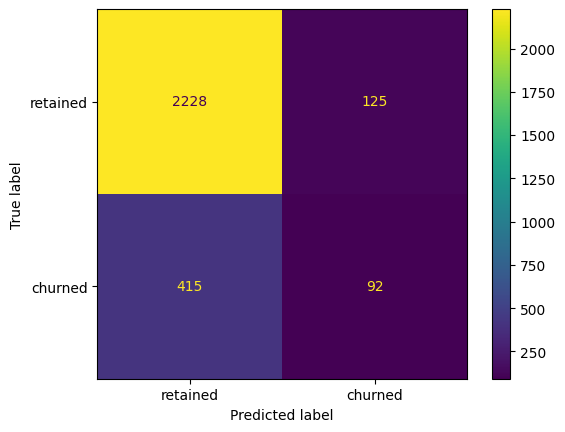

In [167]:
# Generate array of values for confusion matrix
cm = confusion_matrix(y_test, xgb_test_preds, labels=xgb_cv.classes_)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=['retained', 'churned'])
disp.plot();

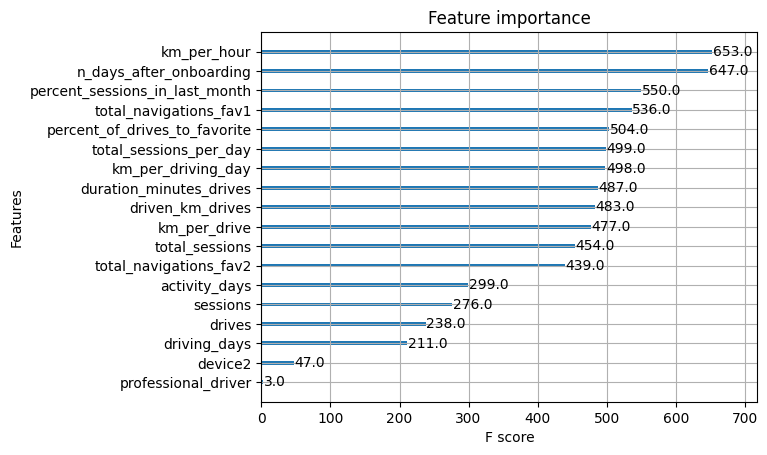

In [168]:
plot_importance(xgb_cv.best_estimator_);

The XGBoost model made more use of many of the features than did the logistic regression model from the previous course, which weighted a single feature (activity_days) very heavily in its final prediction.

If anything, this underscores the importance of feature engineering. Notice that engineered features accounted for six of the top 10 features (and three of the top five). Feature engineering is often one of the best and easiest ways to boost model performance.

Also, note that the important features in one model might not be the same as the important features in another model. That's why you shouldn't discount features as unimportant without thoroughly examining them and understanding their relationship with the dependent variable, if possible. These discrepancies between features selected by models are typically caused by complex feature interactions.

Remember, sometimes your data simply will not be predictive of your chosen target. This is common. Machine learning is a powerful tool, but it is not magic. If your data does not contain predictive signal, even the most complex algorithm will not be able to deliver consistent and accurate predictions. Do not be afraid to draw this conclusion.

Even if you cannot use the model to make strong predictions, was the work done in vain? What insights can you report back to stakeholders?

Identify an optimal decision threshold¶
The default decision threshold for most implementations of classification algorithms—including scikit-learn's—is 0.5. This means that, in the case of the Waze models, if they predicted that a given user had a 50% probability or greater of churning, then that user was assigned a predicted value of 1—the user was predicted to churn.

With imbalanced datasets where the response class is a minority, this threshold might not be ideal. You learned that a precision-recall curve can help to visualize the trade-off between your model's precision and recall.

Here's the precision-recall curve for the XGBoost champion model on the test data.

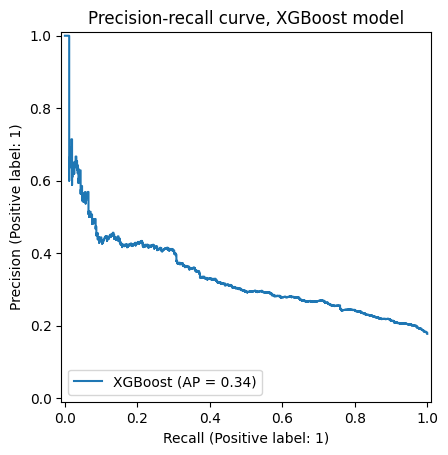

In [169]:
# Plot precision-recall curve
display = PrecisionRecallDisplay.from_estimator(
    xgb_cv.best_estimator_, X_test, y_test, name='XGBoost'
    )
plt.title('Precision-recall curve, XGBoost model');

In [170]:
# Get predicted probabilities on the test data
predicted_probabilities = xgb_cv.best_estimator_.predict_proba(X_test)
predicted_probabilities

array([[0.94572806, 0.05427192],
       [0.57626796, 0.42373207],
       [0.98132175, 0.01867823],
       ...,
       [0.8135836 , 0.18641639],
       [0.9661311 , 0.03386891],
       [0.7386279 , 0.26137212]], dtype=float32)

The predict_proba() method returns a 2-D array of probabilities where each row represents a user. The first number in the row is the probability of belonging to the negative class, the second number in the row is the probability of belonging to the positive class. (Notice that the two numbers in each row are complimentary to each other and sum to one.)

You can generate new predictions based on this array of probabilities by changing the decision threshold for what is considered a positive response. For example, the following code converts the predicted probabilities to {0, 1} predictions with a threshold of 0.4. In other words, any users who have a value ≥ 0.4 in the second column will get assigned a prediction of 1, indicating that they churned.

In [171]:
# Create a list of just the second column values (probability of target)
probs = [x[1] for x in predicted_probabilities]

# Create an array of new predictions that assigns a 1 to any value >= 0.4
new_preds = np.array([1 if x >= 0.4 else 0 for x in probs])
new_preds

array([0, 1, 0, ..., 0, 0, 0])

In [172]:
# Get evaluation metrics for when the threshold is 0.4
get_test_scores('XGB, threshold = 0.4', new_preds, y_test)

,model,precision,recall,F1,accuracy
0,"XGB, threshold = 0.4",0.414986,0.284024,0.337237,0.802098


In [173]:
results


,model,precision,recall,F1,accuracy
0,RF cv,0.457163,0.126782,0.198445,0.818510
0,XGB cv,0.425932,0.170826,0.243736,0.811866
0,RF val,0.445255,0.120316,0.189441,0.817483
0,XGB test,0.423963,0.181460,0.254144,0.811189


Recall and F1 score increased significantly, while precision and accuracy decreased marginally.

So, using the precision-recall curve as a guide, suppose you knew that you'd be satisfied if the model had a recall score of 0.5 and you were willing to accept the ~30% precision score that comes with it. In other words, you'd be happy if the model successfully identified half of the people who will actually churn, even if it means that when the model says someone will churn, it's only correct about 30% of the time.

What threshold will yield this result? There are a number of ways to determine this. Here's one way that uses a function to accomplish this.

In [174]:
def threshold_finder(y_test_data, probabilities, desired_recall):
    '''
    Find the decision threshold that most closely yields a desired recall score.

    Inputs:
        y_test_data: Array of true y values
        probabilities: The results of the `predict_proba()` model method
        desired_recall: The recall that you want the model to have

    Outputs:
        threshold: The decision threshold that most closely yields the desired recall
        recall: The exact recall score associated with `threshold`
    '''
    probs = [x[1] for x in probabilities]  # Isolate second column of `probabilities`
    thresholds = np.arange(0, 1, 0.001)    # Set a grid of 1,000 thresholds to test

    scores = []
    for threshold in thresholds:
        # Create a new array of {0, 1} predictions based on new threshold
        preds = np.array([1 if x >= threshold else 0 for x in probs])
        # Calculate recall score for that threshold
        recall = recall_score(y_test_data, preds)
        # Append the threshold and its corresponding recall score as a tuple to `scores`
        scores.append((threshold, recall))

    distances = []
    for idx, score in enumerate(scores):
        # Calculate how close each actual score is to the desired score
        distance = abs(score[1] - desired_recall)
        # Append the (index#, distance) tuple to `distances`
        distances.append((idx, distance))

    # Sort `distances` by the second value in each of its tuples (least to greatest)
    sorted_distances = sorted(distances, key=lambda x: x[1], reverse=False)
    # Identify the tuple with the actual recall closest to desired recall
    best = sorted_distances[0]
    # Isolate the index of the threshold with the closest recall score
    best_idx = best[0]
    # Retrieve the threshold and actual recall score closest to desired recall
    threshold, recall = scores[best_idx]

    return threshold, recall

In [175]:
# Get the predicted probabilities from the champion model
probabilities = xgb_cv.best_estimator_.predict_proba(X_test)

# Call the function
threshold_finder(y_test, probabilities, 0.5)

(0.194, 0.4990138067061144)

In [176]:
# Create an array of new predictions that assigns a 1 to any value >= 0.124
probs = [x[1] for x in probabilities]
new_preds = np.array([1 if x >= 0.124 else 0 for x in probs])

# Get evaluation metrics for when the threshold is 0.124
get_test_scores('XGB, threshold = 0.124', new_preds, y_test)

,model,precision,recall,F1,accuracy
0,"XGB, threshold = 0.124",0.269262,0.654832,0.381609,0.623776


# Conclusion

Now that you've built and tested your machine learning models, the next step is to share your findings with the Waze leadership team. Consider the following questions as you prepare to write your executive summary. Think about key points you may want to share with the team, and what information is most relevant to the user churn project.

Questions:

Would you recommend using this model for churn prediction? Why or why not?
It depends. What would the model be used for? If it's used to drive consequential business decisions, then no. The model is not a strong enough predictor, as made clear by its poor recall score. However, if the model is only being used to guide further exploratory efforts, then it can have value.

What tradeoff was made by splitting the data into training, validation, and test sets as opposed to just training and test sets?
Splitting the data three ways means that there is less data available to train the model than splitting just two ways. However, performing model selection on a separate validation set enables testing of the champion model by itself on the test set, which gives a better estimate of future performance than splitting the data two ways and selecting a champion model by performance on the test data.

What is the benefit of using a logistic regression model over an ensemble of tree-based models (like random forest or XGBoost) for classification tasks?
Logistic regression models are easier to interpret. Because they assign coefficients to predictor variables, they reveal not only which features factored most heavily into their final predictions, but also the directionality of the weight. In other words, they tell you if each feature is positively or negatively correlated with the target in the model's final prediction.

What is the benefit of using an ensemble of tree-based models like random forest or XGBoost over a logistic regression model for classification tasks?
Tree-based model ensembles are often better predictors. If the most important thing is the predictive power of the model, then tree-based modeling will usually win out against logistic regression (but not always!). They also require much less data cleaning and require fewer assumptions about the underlying distributions of their predictor variables, so they're easier to work with.

What could you do to improve this model?
New features could be engineered to try to generate better predictive signal, as they often do if you have domain knowledge. In the case of this model, the engineered features made up over half of the top 10 most-predictive features used by the model. It could also be helpful to reconstruct the model with different combinations of predictor variables to reduce noise from unpredictive features.

What additional features would you like to have to help improve the model?
It would be helpful to have drive-level information for each user (such as drive times, geographic locations, etc.). It would probably also be helpful to have more granular data to know how users interact with the app. For example, how often do they report or confirm road hazard alerts? Finally, it could be helpful to know the monthly count of unique starting and ending locations each driver inputs.

**Hypothesis Testing**

In [180]:
# calculate counts of churned vs. retained
print(df['label'].value_counts())
print()
print(df['label'].value_counts(normalize=True))

# calculate median values of all columns for churned and retained users
df.groupby('label').median(numeric_only=True)

# **key observation:**
# - Churned users had more no. of drives than retained users in a given month; 50 drives vs. 47 drives
# - Churned users used the app less no. of times than retained users in a given month; 8 times vs. 17 times
# - Churned users used the app less no. of days than retained users in a given month; 6 days vs. 14 days

# **key insight:**
# - Churned users drove more frequently than retained users in a short-period of time and used the app less number of times

label
retained    11763
churned      2536
Name: count, dtype: int64

label
retained    0.822645
churned     0.177355
Name: proportion, dtype: float64


,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,km_per_driving_day,percent_sessions_in_last_month,professional_driver,total_sessions_per_day,km_per_hour,km_per_drive,percent_of_drives_to_favorite,device2,label2
label,,,,,,,,,,,,,,,,,,,
churned,59.0,50.0,164.339042,1321.0,84.5,11.0,3652.655666,1607.183785,8.0,6.0,407.597934,0.438475,0.0,0.130587,119.608930,72.771939,0.723486,1.0,1.0
retained,56.0,47.0,157.586756,1843.0,68.0,9.0,3464.684614,1458.046141,17.0,14.0,256.056187,0.421848,0.0,0.095494,122.953052,73.006576,0.636292,1.0,0.0


In [181]:
## Question 1: What is the median driving distance per drive?

# calculate median values of all columns for churned and retained users
df.groupby('label').median(numeric_only=True)

# calculate median distance in km per drive
medians_by_label = df.groupby('label').median(numeric_only=True)
print('Median distance (in km) per drive:')
medians_by_label['driven_km_drives'] / medians_by_label['drives']

Median distance (in km) per drive:


,0
label,
churned,73.053113
retained,73.716694


In [182]:
## Question 2: What is the median dirving distance per driving day?

# calculate median values of all columns for churned and retained users
df.groupby('label').median(numeric_only=True)

# calculate median distance in km per driving day
medians_by_label = df.groupby('label').median(numeric_only=True)
print('Median distance (in km) per driving day:')
medians_by_label['driven_km_drives'] / medians_by_label['driving_days']

Median distance (in km) per driving day:


,0
label,
churned,608.775944
retained,247.477472


In [183]:
#Churned users made "longer distance travels in in a driving day" than retained users

## Question 3: What is the median number of drives per driving day?

# calculate median values of all columns for churned and retained users
df.groupby('label').median(numeric_only=True)

# calculate median no. of drives per driving day
medians_by_label = df.groupby('label').median(numeric_only=True)
print('Median no. of drives per driving day:')
medians_by_label['drives'] / medians_by_label['driving_days']

Median no. of drives per driving day:


,0
label,
churned,8.333333
retained,3.357143


In [184]:
#Churned users made "more frequent travels in a driving day" than retained users

## Question 4: What percentage of the users are Android users vs. iPhone users?

# calculate the no. of Android vs. iPhone users
print(df['device'].value_counts())

# calculate the proportion
print(df['device'].value_counts(normalize=True))

device
iPhone     9225
Android    5074
Name: count, dtype: int64
device
iPhone     0.64515
Android    0.35485
Name: proportion, dtype: float64


In [186]:
from scipy import stats
# need to convert a categorical variable, "device" to a numerical variable
map_dictionary  = {'iPhone': 1, 'Android': 2}
df['tmp_device'] = df['device']
df['tmp_device'] = df['device'].map(map_dictionary)
df['device'], df['tmp_device']

(0        Android
 1         iPhone
 2        Android
 3         iPhone
 4        Android
           ...   
 14994     iPhone
 14995    Android
 14996     iPhone
 14997     iPhone
 14998     iPhone
 Name: device, Length: 14299, dtype: object,
 0        2
 1        1
 2        2
 3        1
 4        2
         ..
 14994    1
 14995    2
 14996    1
 14997    1
 14998    1
 Name: tmp_device, Length: 14299, dtype: int64)

In [187]:
# generate descriptive statistics of mean; compare the mean drives between different devices
df.groupby('tmp_device')['drives'].mean()

#-->The mean difference between iPhone users and Android users is 1.627

,drives
tmp_device,
1,67.933225
2,66.024241


**Hypothesis testing**
the goal is to conduct a two-sample t-test. Recall the steps for conducting a hypothesis test:

State the null hypothesis and the alternative hypothesis
Choose a signficance level
Find the p-value
Reject or fail to reject the null hypothesis
Note: This is a t-test for two independent samples. This is the appropriate test since the two groups are independent (Android users vs. iPhone users).

Recall the difference between the null hypothesis (
H
0
 ) and the alternative hypothesis (
H
A
 ).

Question: What are your hypotheses for this data project?

1.State the null hypothesis and the alternative hypothesis

Hypotheses:

H
0
 : There is no difference in average number of drives between drivers who use iPhone devices and drivers who use Androids.

H
A
 : There is a difference in average number of drives between drivers who use iPhone devices and drivers who use Androids.

Next, choose 5% as the significance level and proceed with a two-sample t-test.

You can use the stats.ttest_ind() function to perform the test.

Technical note: The default for the argument equal_var in stats.ttest_ind() is True, which assumes population variances are equal. This equal variance assumption might not hold in practice (that is, there is no strong reason to assume that the two groups have the same variance); you can relax this assumption by setting equal_var to False, and stats.ttest_ind() will perform the unequal variances  
t
 -test (known as Welch's t-test). Refer to the scipy t-test documentation for more information.

Isolate the drives column for iPhone users.
Isolate the drives column for Android users.
Perform the t-test

In [188]:
# create two variables that store values in a column, 'drives'
drives_iPhone = df[df['tmp_device']==1]['drives'] # drives for iPhone users
drives_android = df[df['tmp_device']==2]['drives'] # drives for iPhone users

In [189]:
# perform the two-sample t-test
stats.ttest_ind(a=drives_iPhone, b=drives_android, equal_var=False)

#The p-value is 0.14 or 14%

TtestResult(statistic=1.676594122141587, pvalue=0.09365074661708836, df=10826.925404660755)

Reject or fail to reject the null hypothesis

The p-value is larger than the chosen significance level of 5%; therefore, fail to reject the null hypothesis.

Question: Based on the p-value you got above, do you reject or fail to reject the null hypothesis?

Since the p-value is larger than the chosen significance level (5%), you fail to reject the null hypothesis. You conclude that there is not a statistically significant difference in the average number of drives between drivers who use iPhones and drivers who use Androids.

What business insight(s) can you draw from the result of your hypothesis test?
The key business insight is that drivers who use iPhone devices on average have a similar number of drives as those who use Androids.

One potential next step is to explore what other factors influence the variation in the number of drives, and run additonal hypothesis tests to learn more about user behavior. Further, temporary changes in marketing or user interface for the Waze app may provide more data to investigate churn.

**Finally**
In conclusion, our modeling efforts have resulted in a significant increase in recall, reaching 50%. While this improvement is notable, it's crucial to recognize that it has come at the cost of reduced precision and accuracy.

In our current scenario, where churn reduction among app users is paramount, the focus has been on minimizing false negatives. False negatives represent cases where our model predicts that a customer won't churn when they actually would. Missing out on these customers could have adverse consequences, hence the emphasis on maximizing recall.

Additionally, we have further refined our model by tuning the decision threshold and incorporating test scores into our results table. These efforts have contributed to a more nuanced understanding of our model's performance.

These observations provide context for our modeling choices, highlight the trade-offs made to prioritize recall, and underscore our commitment to delivering actionable insights to the Waze leadership team.

In [190]:
# Create an array of new predictions that assigns a 1 to any value >= 0.124
probs = [x[1] for x in probabilities]
new_preds = np.array([1 if x >= 0.124 else 0 for x in probs])

# Get evaluation metrics for when the threshold is 0.124
get_test_scores('XGB, threshold = 0.124', new_preds, y_test)

,model,precision,recall,F1,accuracy
0,"XGB, threshold = 0.124",0.269262,0.654832,0.381609,0.623776
